#Dependencies, Initial Setup...

In [ ]:
!pip install musdb -q
!pip install mir_eval -q
!pip install torchmetrics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.5/963.5 kB 50.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.8/102.8 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 931.6/931.6 kB 47.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 87.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 77.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import musdb
import numpy as np
import IPython.display as ipd
import os
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchaudio
import numpy as np
import librosa
import librosa.display
import soundfile as sf
import matplotlib.pyplot as plt
from tqdm import tqdm

from google.colab import drive

import torch
import torchmetrics
from torchmetrics.audio import SignalDistortionRatio
import torch.nn as nn
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
import seaborn as sns
from scipy.io.wavfile import write

In [ ]:
sns.set()
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

In [ ]:
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
os.environ['MUSDB_PATH'] = "/content"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


#**Data Preprocessing**

##Setups

In [ ]:
musdb_root = "/content/drive/MyDrive/Master's Degree/Audio/FinalProject/musdb18"
spectrogram_root = "/content/drive/My Drive/Master's Degree/Audio/FinalProject/spectrograms"

In [ ]:
mus_train = musdb.DB(download=True, root=musdb_root, subsets="train", split="train")
mus_valid = musdb.DB(download=True, root=musdb_root, subsets="train", split="valid")
mus_test = musdb.DB(download=True, root=musdb_root, subsets="test")

#**Exploratory Data Analysis**

##Example Song

0 - The mixture

1 - The drums

2 - The bass

3 - The rest of the accompaniment

4 - The vocals

In [ ]:
track = mus_train[0]

In [ ]:
print(f"Track Name: {track.name}")
print(f"Track Path: {track.path}")
print(f"Audio Shape: {track.audio.shape}")
print(f"Sample Rate: {track.rate} Hz")
print(f"Sources: {list(track.sources.keys())}")
print(f"Stems Shape: {track.stems.shape}")
print(f"Track Duration: {track.duration:.2f} seconds")

Track Name: A Classic Education - NightOwl
Track Path: /content/drive/MyDrive/Master's Degree/Audio/FinalProject/musdb18/train/A Classic Education - NightOwl.stem.mp4
Audio Shape: (7552000, 2)
Sample Rate: 44100 Hz
Sources: ['vocals', 'drums', 'bass', 'other']
Stems Shape: (5, 7552000, 2)
Track Duration: 171.24 seconds


##Isolated Stems

#### Mixed Audio

In [ ]:
mono_signal = np.mean(track.audio, axis=1)
ipd.Audio(mono_signal, rate=track.rate)

#### Accompaniment Audio

In [ ]:
accompaniment_audio = track.stems[1] + track.stems[2] + track.stems[3]
accompaniment_mono_signal = np.mean(accompaniment_audio, axis=1)

ipd.Audio(accompaniment_mono_signal, rate=track.rate)

#### Vocal Audio

In [ ]:
vocals_signal = np.mean(track.stems[4], axis=1)
ipd.Audio(vocals_signal, rate=track.rate)

###Track Durations

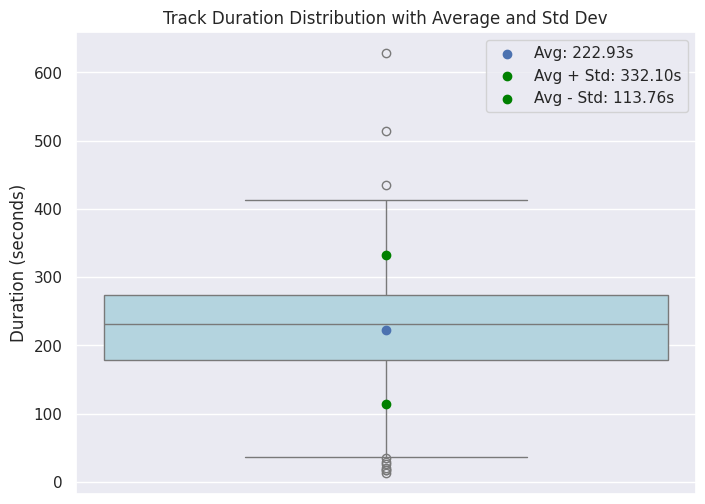

In [ ]:
durations = [track.duration for track in mus_train]

# Compute average and standard deviation
avg_duration = np.mean(durations)
std_duration = np.std(durations)

# Plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=durations, color='lightblue')

# Add average and standard deviation as points
plt.scatter([0], [avg_duration], label=f'Avg: {avg_duration:.2f}s', zorder=2)
plt.scatter([0], [avg_duration + std_duration], color='green', label=f'Avg + Std: {avg_duration + std_duration:.2f}s', zorder=2)
plt.scatter([0], [avg_duration - std_duration], color='green', label=f'Avg - Std: {avg_duration - std_duration:.2f}s', zorder=2)

# Labels and title
plt.title("Track Duration Distribution with Average and Std Dev")
plt.ylabel("Duration (seconds)")
plt.legend()

plt.show()

### Train - Val - Test Split

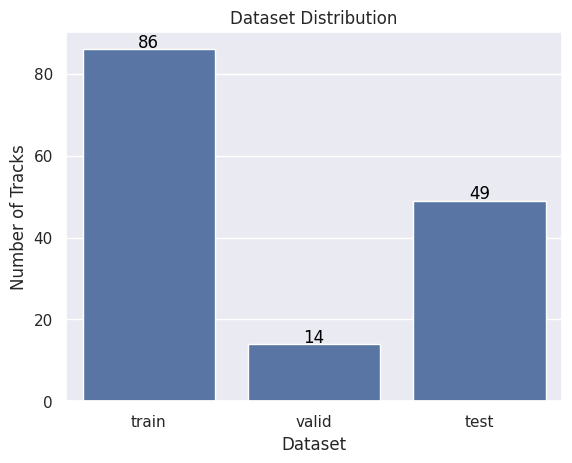

In [ ]:
ax = sns.barplot(x=["train", "valid", "test"], y=[len(mus_train), len(mus_valid), len(mus_test)])
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                fontsize=12, color='black',
                xytext=(0, 5),  # Offset the text a bit above the bar
                textcoords='offset points')

plt.title("Dataset Distribution")
plt.xlabel("Dataset")
plt.ylabel("Number of Tracks")
plt.show()

#### STFT Hyperparameters definition

In [ ]:
# Hyperparameters
n_fft = 1024
hop_length = 512
duration = 6
sample_rate = track.rate

#### Utility methods
- Audio 2 spectrogram
- Spectrogram(s) 2 audio

In [ ]:
def audio_to_spectrogram(audio, sr, n_fft, hop_length, num_samples=None):
    # Convert stereo to mono
    audio = np.mean(audio, axis=1)
    if num_samples is not None:
      audio = audio[:num_samples]
    # Compute STFT
    spectrogram = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)

    # Convert to magnitude spectrogram
    magnitude = np.abs(spectrogram)

    # Convert to log scale
    log_magnitude = librosa.amplitude_to_db(magnitude)

    return torch.tensor(log_magnitude, dtype=torch.float32)

In [ ]:
def spectrogram_to_audio(log_magnitude, sr, n_fft, hop_length, n_iter=32):
    magnitude = librosa.db_to_amplitude(log_magnitude.numpy())
    audio = librosa.griffinlim(magnitude, n_iter=n_iter, n_fft=n_fft, hop_length=hop_length)

    return audio

In [ ]:
def spectrograms_to_audio(log_magnitudes, sr, n_fft, hop_length):
  audios = []
  batch_size = log_magnitudes.shape[0]
  for i in range(batch_size):
    log_magnitude = log_magnitudes[i]
    magnitude = librosa.db_to_amplitude(log_magnitude.numpy())
    audio = librosa.griffinlim(magnitude, n_iter=32, n_fft=n_fft, hop_length=hop_length)
    audios.append(audio)
  return audio

##Example: Audio -> Spectrogram -> Audio

###Original Audio

In [ ]:
mono_signal = np.mean(track.audio, axis=1)
ipd.Audio(mono_signal, rate=track.rate)

###Spectrogram

In [ ]:
def visualize_spectrogram(spectrogram, rate, hop_length, title="Spectrogram"):
    plt.figure(figsize=(10, 5))  # Define figure

    img = librosa.display.specshow(
        np.array(spectrogram),
        sr=rate,  # Fix: Use 'rate' instead of 'sample_rate'
        hop_length=hop_length,
        x_axis="time",
        y_axis="log",
    )

    plt.title(title)  # Use the 'title' parameter
    plt.colorbar(img, format="%+2.0f dB", label="Power (dB)")  # Add colorbar with label

    plt.tight_layout()
    plt.show()


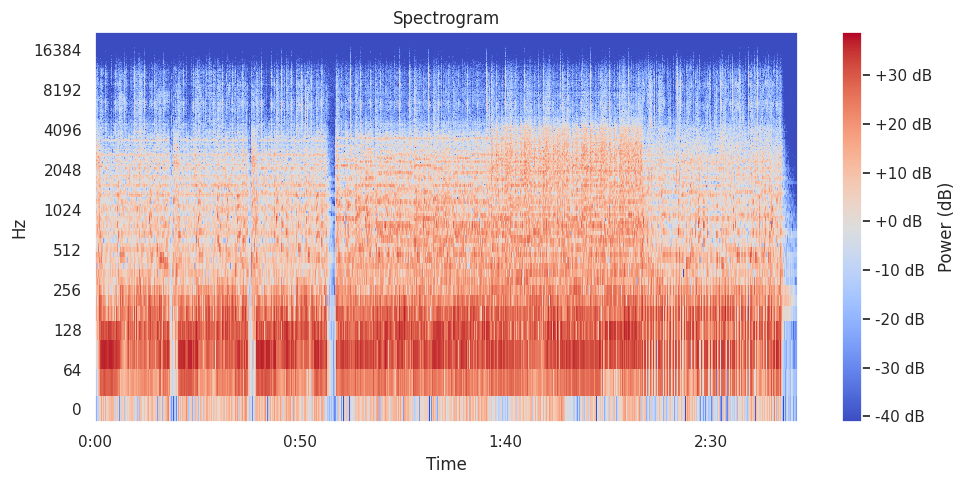

In [ ]:
spectrogram = audio_to_spectrogram(track.audio, track.rate, n_fft, hop_length)
visualize_spectrogram(spectrogram, sample_rate, hop_length, title='Spectrogram')

#### Creating, Saving and Loading spectrograms
- Create and save spectrograms once
- Load them, to speed up the training process
  - No need to recompute during training, which dominates training duration


In [ ]:
def create_mix_spectrograms(mus_dataset, n_fft, hop_length, num_samples=None):
  mixture_spectrograms = []

  for i, track in tqdm(enumerate(mus_dataset), total=len(mus_dataset), desc="Creating Spectrograms"):
    audio, sr = track.audio, track.rate
    spectrogram = audio_to_spectrogram(audio, sr, n_fft, hop_length, num_samples)
    mixture_spectrograms.append(spectrogram)

  return mixture_spectrograms
#train_spectrograms = create_mix_spectrograms(mus_train, n_fft, hop_length)
#valid_spectrograms = create_mix_spectrograms(mus_valid, n_fft, hop_length)
#test_spectrograms = create_mix_spectrograms(mus_test, n_fft, hop_length)

In [ ]:
def create_vocals_spectrograms(mus_dataset, n_fft, hop_length, num_samples=None):
  vocals_spectrograms = []

  for i, track in tqdm(enumerate(mus_dataset), total=len(mus_dataset), desc="Creating Spectrograms"):
    audio, sr = track.stems[4], track.rate
    spectrogram = audio_to_spectrogram(audio, sr, n_fft, hop_length, num_samples)
    vocals_spectrograms.append(spectrogram)

  return vocals_spectrograms

#train_vocals_spectrograms = create_vocals_spectrograms(mus_train, n_fft, hop_length)
#valid_vocals_spectrograms = create_vocals_spectrograms(mus_valid, n_fft, hop_length)
#test_vocals_spectrograms  = create_vocals_spectrograms(mus_test, n_fft, hop_length)

In [ ]:
def create_accompaniment_spectrograms(mus_dataset, n_fft, hop_length, num_samples=None):
  accompaniment_spectrograms = []

  for i, track in tqdm(enumerate(mus_dataset), total=len(mus_dataset), desc="Creating Accompaniment Spectrograms"):
    audio, sr = track.stems[1] + track.stems[2] + track.stems[3], track.rate
    spectrogram = audio_to_spectrogram(audio, sr, n_fft, hop_length, num_samples)
    accompaniment_spectrograms.append(spectrogram)

  return accompaniment_spectrograms

train_accompaniment_spectrograms = create_accompaniment_spectrograms(mus_train, n_fft, hop_length)
valid_accompaniment_spectrograms = create_accompaniment_spectrograms(mus_valid, n_fft, hop_length)
test_accompaniment_spectrograms  = create_accompaniment_spectrograms(mus_test, n_fft, hop_length)

Creating Spectrograms: 100%|██████████| 49/49 [14:17<00:00, 17.49s/it]


In [ ]:
def save_vocal_spectrograms(train_vocal_spectrograms, valid_vocal_spectrograms, test_vocal_spectrograms):
  print("Saving target spectrograms...")
  torch.save(train_vocal_spectrograms, os.path.join(spectrogram_root, "train_target_spectrograms.pt"))
  torch.save(valid_vocal_spectrograms, os.path.join(spectrogram_root, "valid_target_spectrograms.pt"))
  torch.save(test_vocal_spectrograms, os.path.join(spectrogram_root, "test_target_spectrograms.pt"))

#save_vocal_spectrograms(train_vocal_spectrograms, valid_vocal_spectrograms, test_vocal_spectrograms)

In [ ]:
def save_accompaniment_spectrograms(train_accompaniment_spectrograms, valid_accompaniment_spectrograms, test_accompaniment_spectrograms):
  print("Saving target spectrograms...")
  torch.save(train_accompaniment_spectrograms, os.path.join(spectrogram_root, "train_accompaniment_spectrograms.pt"))
  torch.save(valid_accompaniment_spectrograms, os.path.join(spectrogram_root, "valid_accompaniment_spectrograms.pt"))
  torch.save(test_accompaniment_spectrograms, os.path.join(spectrogram_root, "test_accompaniment_spectrograms.pt"))

save_accompaniment_spectrograms(train_accompaniment_spectrograms, valid_accompaniment_spectrograms, test_accompaniment_spectrograms)

Saving target spectrograms...


In [ ]:
def load_spectrograms(file_path):
    print(f"Loading spectrograms from {file_path}...")
    spectrograms = torch.load(file_path)
    return spectrograms

train_mix_spectrograms = load_spectrograms(os.path.join(spectrogram_root, "train_mixture_spectrograms.pt"))
valid_mix_spectrograms = load_spectrograms(os.path.join(spectrogram_root, "valid_mixture_spectrograms.pt"))
test_mix_spectrograms  = load_spectrograms(os.path.join(spectrogram_root, "test_mixture_spectrograms.pt"))

train_vocal_spectrograms = load_spectrograms(os.path.join(spectrogram_root, "train_vocal_spectrograms.pt"))
valid_vocal_spectrograms = load_spectrograms(os.path.join(spectrogram_root, "valid_vocal_spectrograms.pt"))
test_vocal_spectrograms  = load_spectrograms(os.path.join(spectrogram_root, "test_vocal_spectrograms.pt"))

train_accompaniment_spectrograms = load_spectrograms(os.path.join(spectrogram_root, "train_accompaniment_spectrograms.pt"))
valid_accompaniment_spectrograms = load_spectrograms(os.path.join(spectrogram_root, "valid_accompaniment_spectrograms.pt"))
test_accompaniment_spectrograms  = load_spectrograms(os.path.join(spectrogram_root, "test_accompaniment_spectrograms.pt"))

Loading spectrograms from /content/drive/My Drive/Master's Degree/Audio/FinalProject/spectrograms/train_mixture_spectrograms.pt...


<ipython-input-13-ca052ce8d32a>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  spectrograms = torch.load(file_path)


Loading spectrograms from /content/drive/My Drive/Master's Degree/Audio/FinalProject/spectrograms/train_vocal_spectrograms.pt...
Loading spectrograms from /content/drive/My Drive/Master's Degree/Audio/FinalProject/spectrograms/train_accompaniment_spectrograms.pt...


#### Dataset & Dataloader
- Store the calculated mix, vocal & accompaniment spectrograms
- On retrieval, samples a random `duration=6` seconds bit based on calculated `start_frame` and `end_frame`
- Slice from the whole song's spectrogram the relevant interval

In [ ]:
class SpectrogramDataset(Dataset):
    def __init__(self, mix_spectrograms, vocal_spectrograms, accompaniment_spectrograms, n_fft, hop_length, duration, sample_rate):
        self.mix_spectrograms = mix_spectrograms
        self.vocal_spectrograms = vocal_spectrograms
        self.accompaniment_spectrograms = accompaniment_spectrograms
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.duration = duration
        self.sample_rate = sample_rate

    def __len__(self):
        return len(self.mix_spectrograms)

    def __getitem__(self, idx):
      num_frames = self.mix_spectrograms[idx].shape[1]
      frames_per_chunk = int((self.duration * self.sample_rate) / self.hop_length)
      start_frame = np.random.randint(0, num_frames - frames_per_chunk + 1)
      end_frame = start_frame + frames_per_chunk

      mix_spectrogram = self.random_crop_spectrogram(self.mix_spectrograms[idx], start_frame, end_frame)
      vocals_spectrogram = self.random_crop_spectrogram(self.vocal_spectrograms[idx], start_frame, end_frame)
      accompaniment_spectrogram = self.random_crop_spectrogram(self.accompaniment_spectrograms[idx], start_frame, end_frame)

      return mix_spectrogram, vocals_spectrogram, accompaniment_spectrogram

    def random_crop_spectrogram(self, spectrogram, start_frame, end_frame):
      return spectrogram[:, start_frame:end_frame]

    def get_spectrogram_slice(self, idx, start_frame, end_frame):
        """Helper method to extract a spectrogram slice."""
        mix_spectrogram = self.mix_spectrograms[idx][:, start_frame:end_frame]
        vocals_spectrogram = self.vocal_spectrograms[idx][:, start_frame:end_frame]
        accompaniment_spectrogram = self.accompaniment_spectrograms[idx][:, start_frame:end_frame]
        return mix_spectrogram, vocals_spectrogram, accompaniment_spectrogram

    def get_spectrogram_by_time(self, idx, start_time_sec):
        """
        Args:
            idx (int): Index of the dataset item.
            start_time_sec (float): Start time in seconds.

        Returns:
            Tuple of (mix_spectrogram, vocals_spectrogram, accompaniment_spectrogram)
        """
        num_frames = self.mix_spectrograms[idx].shape[1]
        frames_per_second = self.sample_rate // self.hop_length
        start_frame = int(start_time_sec * frames_per_second)
        frames_per_chunk = int((self.duration * self.sample_rate) / self.hop_length)
        end_frame = start_frame + frames_per_chunk

        if end_frame > num_frames:
            raise ValueError(f"Start time {start_time_sec}s is too close to the end of the audio.")

        return self.get_spectrogram_slice(idx, start_frame, end_frame)

In [ ]:
train_dataset = SpectrogramDataset(train_mix_spectrograms, train_vocal_spectrograms, train_accompaniment_spectrograms, n_fft, hop_length, duration, sample_rate)
validation_dataset = SpectrogramDataset(valid_mix_spectrograms, valid_vocal_spectrograms, valid_accompaniment_spectrograms, n_fft, hop_length, duration, sample_rate)
test_dataset = SpectrogramDataset(test_mix_spectrograms, test_vocal_spectrograms, test_accompaniment_spectrograms, n_fft, hop_length, duration, sample_rate)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=5, shuffle=True)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=5, shuffle=False)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=5, shuffle=False)

#**Model Definition**

A UNet architecture
- Encoder, Decoder:
  - 4 Convolution blocks (Conv-Batchnorm-Relu-Conv-Batchnorm-Relu)
- Decoder is mostly the inverse of the encoder
- A bottle neck layer
- Output channel is 2, corresponding to 2 masks `vocals_mask`, `accompaniment_mask`
- `kernel_size` by default is 5, see hyperparameters tuning section
- Added a classification branch, to classify whether spectrogram represents vocals or accompaniment
  - Fully connected layer on top of the encoder, with 2 output neurons
  - Used cross entropy loss
  - Used as a sanity check that the learned representations are meaningful
  - Wasn't used in the final model, as it didn't contribute to reconstruction quality

In [ ]:
class UNet(nn.Module):
    def __init__(self, input_channels=1, output_channels=2, encoder_channels=[64, 128, 256, 512], decoder_channels=[512, 256, 128, 64], kernel_size=5, sigmoid=False, fc_hidden=128):
        super(UNet, self).__init__()
        self.kernel_size = kernel_size
        self.sigmoid = sigmoid

        # Encoder
        self.encoder = nn.ModuleList()
        in_channels = input_channels
        for out_channels in encoder_channels:
            self.encoder.append(self.conv_block(in_channels, out_channels))
            in_channels = out_channels

        # Bottleneck
        self.bottleneck = self.conv_block(encoder_channels[-1], encoder_channels[-1] * 2)

        # Decoder (Upsampling Path)
        self.upconvs = nn.ModuleList()
        self.decoder = nn.ModuleList()
        for enc_ch, dec_ch in zip(encoder_channels[::-1], decoder_channels):
            self.upconvs.append(nn.ConvTranspose2d(enc_ch * 2, enc_ch, kernel_size=2, stride=2))
            self.decoder.append(self.conv_block(enc_ch * 2, dec_ch))

        # Final output layer
        self.final = nn.Conv2d(decoder_channels[-1], output_channels, kernel_size=1)

        # **Classification Head**
        bottleneck_features = encoder_channels[-1] * 2
        self.fc1 = nn.Linear(bottleneck_features, fc_hidden)
        self.fc2 = nn.Linear(fc_hidden, 1)
        self.fc_activation = nn.Sigmoid()

    def conv_block(self, in_channels, out_channels):
        padding = self.kernel_size // 2
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, self.kernel_size, stride=1, padding=padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, self.kernel_size, stride=1, padding=padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def encode(self, x):
        """ Extracts feature maps using the encoder + bottleneck """
        skip_connections = []
        for layer in self.encoder:
            x = layer(x)
            skip_connections.append(x)
            x = F.max_pool2d(x, kernel_size=2)
        x = self.bottleneck(x)
        return x, skip_connections  # Return encoded features and skip connections

    def decode(self, x, skip_connections):
        """ Reconstructs input using the decoder """
        skip_connections = skip_connections[::-1]  # Reverse for skip connections
        for upconv, layer, skip in zip(self.upconvs, self.decoder, skip_connections):
            x = upconv(x)
            if x.shape[2:] != skip.shape[2:]:  # Resize skip connection
                skip = F.interpolate(skip, size=x.shape[2:], mode="bilinear", align_corners=False)
            x = torch.cat([x, skip], dim=1)
            x = layer(x)
        x = self.final(x)
        if self.sigmoid:
            x = torch.sigmoid(x)
        return x

    def classify(self, x):
        """ Classifies based on the encoded features """
        x, _ = self.encode(x)  # Encode only
        x = F.adaptive_avg_pool2d(x, 1)  # Reduce spatial dimensions
        x = torch.flatten(x, start_dim=1)
        x = F.relu(self.fc1(x))
        x = self.fc_activation(self.fc2(x))
        return x  # Binary classification output

    def forward(self, x, classify_only=False):
        """ Forward method to handle segmentation and classification separately """
        if classify_only:
            return self.classify(x)  # Only classification
        x, skip_connections = self.encode(x)  # Encode
        x = self.decode(x, skip_connections)  # Decode
        return x


### Visualization Utility Methods

In [ ]:
def moving_average(data, window_size):
        return [sum(data[i:i+window_size]) / window_size for i in range(len(data) - window_size + 1)]

In [ ]:
def plot_avg_losses(train_losses, val_losses, train_vocal_losses, val_vocal_losses,
                     train_accompaniment_losses, val_accompaniment_losses,
                     train_accs, val_accs, train_cls_losses, val_cls_losses,
                     window_size=5, truncate=100):
    # Remove first values
    train_losses = train_losses[truncate:]
    val_losses = val_losses[truncate:]
    train_vocal_losses = train_vocal_losses[truncate:]
    val_vocal_losses = val_vocal_losses[truncate:]
    train_accompaniment_losses = train_accompaniment_losses[truncate:]
    val_accompaniment_losses = val_accompaniment_losses[truncate:]
    train_accs = train_accs
    val_accs = val_accs
    train_cls_losses = train_cls_losses
    val_cls_losses = val_cls_losses

    # Apply moving average


    train_losses_smooth = moving_average(train_losses, window_size)
    val_losses_smooth = moving_average(val_losses, window_size)
    train_vocal_losses_smooth = moving_average(train_vocal_losses, window_size)
    val_vocal_losses_smooth = moving_average(val_vocal_losses, window_size)
    train_accompaniment_losses_smooth = moving_average(train_accompaniment_losses, window_size)
    val_accompaniment_losses_smooth = moving_average(val_accompaniment_losses, window_size)
    train_accs_smooth = moving_average(train_accs, window_size)
    #val_accs_smooth = moving_average(val_accs, window_size)
    #train_cls_losses_smooth = moving_average(train_cls_losses, window_size)
    #val_cls_losses_smooth = moving_average(val_cls_losses, window_size)

    # Adjust epochs to match smoothed values
    epochs = range(1, len(train_losses_smooth) + 1)

    plt.figure(figsize=(12, 10))

    # Plot total loss
    plt.subplot(2, 2, 1)
    plt.plot(epochs, train_losses_smooth, label="Train Loss", linestyle='-')
    plt.plot(epochs, val_losses_smooth, label="Validation Loss", linestyle='-')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Total Loss (Smoothed)")
    plt.legend()

    # Plot vocal & accompaniment losses
    plt.subplot(2, 2, 2)
    plt.plot(epochs, train_vocal_losses_smooth, label="Train Vocal Loss", linestyle='-')
    plt.plot(epochs, val_vocal_losses_smooth, label="Validation Vocal Loss", linestyle='-')
    plt.plot(epochs, train_accompaniment_losses_smooth, label="Train Accompaniment Loss", linestyle='-')
    plt.plot(epochs, val_accompaniment_losses_smooth, label="Validation Accompaniment Loss", linestyle='-')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Vocal & Accompaniment Losses (Smoothed)")
    plt.legend()

    # Plot train & val accuracies
    plt.subplot(2, 2, 3)

    plt.plot(train_accs_smooth, label="Train Accuracy", linestyle='-')
    #plt.plot(epochs, val_accs_smooth, label="Validation Accuracy", linestyle='-')
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Train Accuracy (Smoothed)")
    plt.legend()

    # Plot train & val classification losses
    plt.subplot(2, 2, 4)
    plt.plot(train_cls_losses, label="Train Classification Loss", linestyle='-')
    #plt.plot(epochs, val_cls_losses_smooth, label="Validation Classification Loss", linestyle='-')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Train Classification Loss (Smoothed)")
    plt.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_losses(train_losses, val_losses, train_vocal_losses, val_vocal_losses, train_accompaniment_losses, val_accompaniment_losses):
    train_losses = train_losses[1:]
    val_losses = val_losses[1:]
    train_vocal_losses = train_vocal_losses[1:]
    val_vocal_losses = val_vocal_losses[1:]
    train_accompaniment_losses = train_accompaniment_losses[1:]
    val_accompaniment_losses = val_accompaniment_losses[1:]

    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 6))

    # Plot total loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label="Train Loss")
    plt.plot(epochs, val_losses, label="Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Total Loss")
    plt.legend()

    # Plot vocal & accompaniment losses
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_vocal_losses, label="Train Vocal Loss")
    plt.plot(epochs, val_vocal_losses, label="Validation Vocal Loss")
    plt.plot(epochs, train_accompaniment_losses, label="Train Accompaniment Loss")
    plt.plot(epochs, val_accompaniment_losses, label="Validation Accompaniment Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Vocal & Accompaniment Losses")
    plt.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_sdr(train_sdrs, val_sdrs, window_size=20, truncate=10):
  plt.figure(figsize=(8, 6))
  train_sdrs = moving_average(train_sdrs[truncate:], window_size)
  val_sdrs = moving_average(val_sdrs[truncate:], window_size)
  plt.plot(train_sdrs, label='Train SDR')
  plt.plot(val_sdrs, label='Validation SDR')
  plt.xlabel("Epochs")
  plt.ylabel("SDR (dB)")
  plt.title("Source-to-Distortion Ratio (SDR) over Training")
  plt.legend()
  plt.grid()
  #plt.show()


### Training loop
- Tracked L1 loss, cross entropy loss, SDR, and accuracy over time for training and validation set
- Used L1 loss over the masked mixed audio, attempting to reconstruct the vocals and accompaniment
- Calculated SDR over time to track the reconstruction quality
- Used cross entropy loss for source classification

In [ ]:
def train(model, train_loader, val_loader, criterion, optimizer, vocals_weight, accompaniment_weight, num_epochs=10, window_size=100, cls_criterion = nn.BCELoss()):
    best_val_loss = float("inf")

    train_losses = []
    train_sdrs = []
    train_vocal_losses = []
    train_accompaniment_losses = []
    train_cls_losses = []  # Add to track classification loss for training
    train_accs = []  # Add to track accuracy for training
    train_reconstruction_losses = []

    val_losses = []
    val_sdrs = []
    val_vocal_losses = []
    val_accompaniment_losses = []
    val_cls_losses = []  # Add to track classification loss for validation
    val_accs = []  # Add to track accuracy for validation

    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=500, min_lr=5e-4, threshold=0.5)
    prev_lr = None
    # SDR metric

    sdr_metric = SignalDistortionRatio().to(device)

    progress_bar = tqdm(range(num_epochs), desc="Training...", total=num_epochs, unit="epoch")
    for epoch in progress_bar:

        model.train()
        acc_train_loss = 0
        acc_train_vocal_loss = 0
        acc_train_accompaniment_loss = 0
        acc_train_sdr = 0  # Store SDR
        acc_train_cls_loss = 0
        correct_train_preds = 0
        total_train_samples = 0

        for mixed_batch, vocal_batch, accompaniment_batch in train_loader:
            mixed_batch, vocal_batch, accompaniment_batch = mixed_batch.unsqueeze(1).to(device), vocal_batch.unsqueeze(1).to(device), accompaniment_batch.unsqueeze(1).to(device)

            optimizer.zero_grad()

            y_vocal = model.classify(vocal_batch)  # Outputs a probability (sigmoid)
            y_accompaniment = model.classify(accompaniment_batch)
            #print("predictions:", y_vocal.item(), y_accompaniment.item())
            target_vocal = torch.ones_like(y_vocal)  # Binary label for vocal class (1)
            target_accompaniment = torch.zeros_like(y_accompaniment)  # Binary label for accompaniment class (0)

            cls_loss = cls_criterion(y_vocal, target_vocal) + cls_criterion(y_accompaniment, target_accompaniment)

            masks = model(mixed_batch)
            vocal_masks, accompaniment_masks = masks[:,0,:,:], masks[:,1,:,:]

            # Resize masks to match input
            vocal_masks = F.interpolate(vocal_masks.unsqueeze(1), size=mixed_batch.shape[2:], mode="bilinear", align_corners=False)
            accompaniment_masks = F.interpolate(accompaniment_masks.unsqueeze(1), size=mixed_batch.shape[2:], mode="bilinear", align_corners=False)

            masked_vocals = mixed_batch * vocal_masks
            masked_accompaniment = mixed_batch * accompaniment_masks

            train_vocals_loss = criterion(masked_vocals, vocal_batch)
            train_accompaniment_loss = criterion(masked_accompaniment, accompaniment_batch)

            reconstruction_loss = criterion(masked_vocals + masked_accompaniment, mixed_batch)

            total_loss = vocals_weight * train_vocals_loss + accompaniment_weight * train_accompaniment_loss + 0.1*reconstruction_loss# + cls_loss + reconstruction_loss
            total_loss.backward()
            optimizer.step()

            acc_train_loss += total_loss.detach().item()
            acc_train_vocal_loss += train_vocals_loss.detach().item()
            acc_train_accompaniment_loss += train_accompaniment_loss.detach().item()

            # Compute SDR
            sdr = sdr_metric(masked_vocals.detach(), vocal_batch.detach())
            acc_train_sdr += sdr.mean().detach().item()  # Convert tensor to scalar and sum up

            # Classification loss and accuracy
            acc_train_cls_loss += cls_loss.detach().item()

            predicted_vocal = (y_vocal > 0.5).float()
            predicted_accompaniment = (y_accompaniment <= 0.5).float()
            correct_train_preds = predicted_vocal.sum().item() + predicted_accompaniment.sum().item()
            total_train_samples += len(vocal_batch) * 2  # Each batch has vocals + accompaniment

            # Free GPU memory
            del mixed_batch, vocal_batch, accompaniment_batch
            del masks, vocal_masks, accompaniment_masks
            del masked_vocals, masked_accompaniment

            torch.cuda.empty_cache()  # Clear unused memory

        avg_train_loss = acc_train_loss / len(train_loader)
        avg_train_vocal_loss = acc_train_vocal_loss / len(train_loader)
        avg_train_accompaniment_loss = acc_train_accompaniment_loss / len(train_loader)
        avg_train_sdr = acc_train_sdr / len(train_loader)
        avg_train_cls_loss = acc_train_cls_loss / len(train_loader)

        train_acc = correct_train_preds / total_train_samples

        train_losses.append(avg_train_loss)
        train_vocal_losses.append(avg_train_vocal_loss)
        train_accompaniment_losses.append(avg_train_accompaniment_loss)
        train_sdrs.append(avg_train_sdr)
        train_cls_losses.append(avg_train_cls_loss)
        train_accs.append(train_acc)
        train_reconstruction_losses.append(reconstruction_loss.item())
        # --- Validation Phase ---
        model.eval()
        acc_val_loss = 0.0
        acc_val_sdr = 0.0
        acc_val_vocal_loss = 0
        acc_val_accompaniment_loss = 0
        acc_val_cls_loss = 0
        correct_val_preds = 0
        total_val_samples = 0

        with torch.no_grad():
            for val_mixed_batch, val_vocal_batch, val_accompaniment_batch in val_loader:
                val_mixed_batch, val_vocal_batch, val_accompaniment_batch = val_mixed_batch.unsqueeze(1).to(device), val_vocal_batch.unsqueeze(1).to(device), val_accompaniment_batch.unsqueeze(1).to(device)

                y_vocal = model.classify(val_vocal_batch)  # Outputs a probability (sigmoid)
                y_accompaniment = model.classify(val_accompaniment_batch)
                #print(f"y_vocal={y_vocal.item()}", f"y_accompaniment={y_accompaniment.item()}")

                target_vocal = torch.ones_like(y_vocal)  # Binary label for vocal class (1)
                target_accompaniment = torch.zeros_like(y_accompaniment)  # Binary label for accompaniment class (0)

                cls_loss = cls_criterion(y_vocal, target_vocal) + cls_criterion(y_accompaniment, target_accompaniment)

                val_masks = model(val_mixed_batch)
                val_vocal_masks, val_accompaniment_masks = val_masks[:,0,:,:], val_masks[:,1,:,:]

                val_vocal_masks = F.interpolate(val_vocal_masks.unsqueeze(1), size=val_mixed_batch.shape[2:], mode="bilinear", align_corners=False)
                val_accompaniment_masks = F.interpolate(val_accompaniment_masks.unsqueeze(1), size=val_mixed_batch.shape[2:], mode="bilinear", align_corners=False)

                val_masked_vocals = val_mixed_batch * val_vocal_masks
                val_masked_accompaniment = val_mixed_batch * val_accompaniment_masks

                val_vocals_loss = criterion(val_masked_vocals, val_vocal_batch).detach().item()
                val_accompaniment_loss = criterion(val_masked_accompaniment, val_accompaniment_batch).detach().item()

                acc_val_loss += vocals_weight * val_vocals_loss + accompaniment_weight * val_accompaniment_loss
                acc_val_vocal_loss += val_vocals_loss
                acc_val_accompaniment_loss += val_accompaniment_loss

                # Compute SDR
                sdr = sdr_metric(val_masked_vocals.detach(), val_vocal_batch.detach())
                acc_val_sdr += sdr.mean().detach().item()

                # Classification loss and accuracy
                # Classification loss and accuracy
                acc_val_cls_loss += cls_loss.detach().item()

                predicted_vocal = (y_vocal > 0.5).float()
                predicted_accompaniment = (y_accompaniment <= 0.5).float()
                #print(predicted_vocal, target_vocal)
                correct_val_preds = predicted_vocal.sum().item() + predicted_accompaniment.sum().item()
                total_val_samples += len(val_vocal_batch) * 2  # Each batch has vocals + accompaniment

            # Free GPU memory
            del val_mixed_batch, val_vocal_batch, val_accompaniment_batch
            del val_masks, val_vocal_masks, val_accompaniment_masks
            del val_masked_vocals, val_masked_accompaniment
            torch.cuda.empty_cache()  # Clear unused memory

        avg_val_loss = acc_val_loss / len(val_loader)
        avg_val_vocal_loss = acc_val_vocal_loss / len(val_loader)
        avg_val_accompaniment_loss = acc_val_accompaniment_loss / len(val_loader)
        avg_val_sdr = acc_val_sdr / len(val_loader)
        avg_val_cls_loss = acc_val_cls_loss / len(val_loader)
        val_acc = correct_val_preds / total_val_samples

        val_losses.append(avg_val_loss)
        val_sdrs.append(avg_val_sdr)
        val_vocal_losses.append(avg_val_vocal_loss)
        val_accompaniment_losses.append(avg_val_accompaniment_loss)
        val_cls_losses.append(avg_val_cls_loss)
        val_acc = correct_val_preds / total_val_samples
        val_accs.append(val_acc)

        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), "best_model.pth")

        scheduler.step(avg_val_loss)
        current_lr = scheduler.optimizer.param_groups[0]['lr']

        # Update tqdm description with losses, SDR, and classification metrics
        progress_bar.set_postfix({
            'train_loss': np.mean(train_losses[-window_size:]),
            'train_vocal_loss': np.mean(train_vocal_losses[-window_size:]),
            'train_accompaniment_loss': np.mean(train_accompaniment_losses[-window_size:]),
            'train_sdr': np.mean(train_sdrs[-window_size:]),
            'train_reconstruction_loss': np.mean(train_reconstruction_losses[-window_size:]),

            #'train_cls_loss': np.mean(train_cls_losses[-window_size:]),
            #'train_acc': np.mean(train_accs[-window_size:]),
            'val_loss': np.mean(val_losses[-window_size:]),
            'val_vocal_loss': np.mean(val_vocal_losses[-window_size:]),
            'val_accompaniment_loss': np.mean(val_accompaniment_losses[-window_size:]),
            'val_sdr': np.mean(val_sdrs[-window_size:]),
            #'val_cls_loss': np.mean(val_cls_losses[-window_size:]),
            #'val_acc': np.mean(val_accs[-window_size:]),
            'lr': current_lr
        })

    return train_losses, val_losses, train_vocal_losses, val_vocal_losses, train_accompaniment_losses, val_accompaniment_losses, train_sdrs, val_sdrs, train_accs, val_accs, train_cls_losses, val_cls_losses


In [ ]:
epochs = 10000

In [ ]:
model = UNet().to(device)

In [ ]:
optimizer = Adam(model.parameters(), lr=1e-3)
criterion = nn.L1Loss()
vocals_weight = 0.5
accompaniment_weight = 1 - vocals_weight
#criterion = nn.MSELoss()

In [ ]:
train(model, train_dataloader, validation_dataloader, criterion, optimizer, vocals_weight, accompaniment_weight, num_epochs=epochs)

In [ ]:
item_index = 1

In [ ]:
masks = model(mix_batch)
mask = masks[item_index, 0, :, :].squeeze()
vocals_spectrogram = mix_batch[0, 0, :, :] * mask


vocals_spectrogram shape: torch.Size([513, 516])


In [ ]:
# Convert back to audio using ISTFT (no phase estimation needed!)
mixed_audio = spectrogram_to_audio(mixed_song.detach().cpu(), sample_rate, n_fft, hop_length)

# Play the extracted vocals
ipd.Audio(mixed_audio, rate=sample_rate)

In [ ]:
# Convert back to audio using ISTFT (no phase estimation needed!)
vocals_audio = spectrogram_to_audio(vocals_spectrogram.detach().cpu(), sample_rate, n_fft, hop_length)

# Play the extracted vocals
ipd.Audio(vocals_audio, rate=sample_rate)

In [ ]:
mixed_audio = spectrogram_to_audio(mixed_song.detach().cpu(), sample_rate, n_fft, hop_length)

# Play the extracted vocals
ipd.Audio(mixed_audio, rate=sample_rate)

In [ ]:
vocals_audio = spectrogram_to_audio(vocals_spectrogram.detach().cpu(), sample_rate, n_fft, hop_length)

# Play the extracted vocals
ipd.Audio(vocals_audio, rate=sample_rate)

-----------------------------------------------------

###Original bit

In [ ]:
train_batch = next(iter(train_dataloader))
mix_spectrogram, vocal_spectrogram, accompaniment_spectrogram = train_batch
mix_spectrogram, vocal_spectrogram, accompaniment_spectrogram = mix_spectrogram.to(device), vocal_spectrogram.to(device), accompaniment_spectrogram.to(device)

In [ ]:
mix_spectrogram[0].shape

torch.Size([513, 516])

In [ ]:
reconstructed_audio = spectrogram_to_audio(mix_spectrogram[1].cpu(), sample_rate, n_fft, hop_length)
ipd.Audio(reconstructed_audio, rate=sample_rate)

###Ideal Reconstruction

Vocals

In [ ]:
reconstructed_vocals = spectrogram_to_audio(vocal_spectrogram[1].cpu(), sample_rate, n_fft, hop_length)
ipd.Audio(reconstructed_vocals, rate=sample_rate)

Accompaniment

In [ ]:
reconstructed_accompaniment = spectrogram_to_audio(accompaniment_spectrogram[1].cpu(), sample_rate, n_fft, hop_length)
ipd.Audio(reconstructed_accompaniment, rate=sample_rate)

###Model Reconstruction

In [ ]:
def plot_masks(vocal_mask, accompaniment_mask):
    vocal_mask = vocal_mask.detach().cpu().numpy()  # Convert to NumPy
    accompaniment_mask = accompaniment_mask.detach().cpu().numpy()  # Convert to NumPy

    plt.figure(figsize=(12, 5))

    # Plot vocal mask
    plt.subplot(1, 2, 1)
    sns.heatmap(vocal_mask, cmap="viridis", cbar=True)
    plt.title("Vocal Mask")
    plt.xlabel("Time")
    plt.ylabel("Frequency")

    # Plot accompaniment mask
    plt.subplot(1, 2, 2)
    sns.heatmap(accompaniment_mask, cmap="viridis", cbar=True)
    plt.title("Accompaniment Mask")
    plt.xlabel("Time")
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()


#**Overfitting a small dataset**

Trying to fit the entire dataset was to difficult for the model to learn.

As recommended by you, i started by trying to overfit a smaller dataset - a single song.

Note:
As i'm randomly sampling 6 seconds segments, i'm not overfitting the same segments in the learning process - each segment may overlap with others, but is unique. I.e., there are no repeating training samples in the learning process

### The Track


- Track Name: NightOwl
- Track Artist: A Classic Education
- Track Duration: 171 seconds
- Channels: 2, which are merged two 1 using mean
- Sample rate: 44.1k Hz
- Stems Extracted:
  - Stem 1: vocals
  - Stem 2 + 3 + 4: rest of the accompaniment (Drums, Bass, Others)

In [ ]:
def get_single_song():
  track = mus_train[0]

  mixed_audio = track.audio
  vocals_audio  = track.stems[4]
  accompaniment_audio = track.stems[1] + track.stems[2] + track.stems[3]

  return mixed_audio, vocals_audio, accompaniment_audio

In [ ]:
def get_single_song_spectrograms(mixed_audio, vocals_audio, accompaniment_audio, sample_rate, n_fft, hop_length, duration):
  mixed_spectrogram = audio_to_spectrogram(mixed_audio, sample_rate, n_fft, hop_length)
  vocal_spectrogram = audio_to_spectrogram(vocals_audio, sample_rate, n_fft, hop_length)
  accompaniment_spectrogram = audio_to_spectrogram(accompaniment_audio, sample_rate, n_fft, hop_length)

  return mixed_spectrogram, vocal_spectrogram, accompaniment_spectrogram

In [ ]:
def get_reconstructed_audios(mixed_spectrogram, vocal_spectrogram, accompaniment_spectrogram, sample_rate, n_fft, hop_length, duration):
  reconstructed_mix_audio = spectrogram_to_audio(mixed_spectrogram, sample_rate, n_fft, hop_length)
  reconstructed_vocals_audio = spectrogram_to_audio(vocal_spectrogram, sample_rate, n_fft, hop_length)
  reconstructed_accompaniment_audio = spectrogram_to_audio(accompaniment_spectrogram, sample_rate, n_fft, hop_length)

  return reconstructed_mix_audio, reconstructed_vocals_audio, reconstructed_accompaniment_audio

In [ ]:
mixed_audio, vocals_audio, accompaniment_audio = get_single_song()
mixed_spectrogram, vocal_spectrogram, accompaniment_spectrogram = get_single_song_spectrograms(mixed_audio, vocals_audio, accompaniment_audio, sample_rate, n_fft, hop_length, duration)
reconstructed_mix_audio, reconstructed_vocals_audio, reconstructed_accompaniment_audio = get_reconstructed_audios(mixed_spectrogram, vocal_spectrogram, accompaniment_spectrogram, sample_rate, n_fft, hop_length, duration)

###**Single Track Audios**

In [ ]:
ipd.Audio(reconstructed_mix_audio, rate=track.rate)

In [ ]:
ipd.Audio(reconstructed_vocals_audio, rate=track.rate)

In [ ]:
ipd.Audio(reconstructed_accompaniment_audio, rate=track.rate)

##**Training**

##**Data loading**

In [ ]:
samples_amount = 1
batch_size = 1

In [ ]:
train_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)
#------------- train on purpose -------------
validation_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)
#test_dataset = SpectrogramDataset(test_mix_spectrograms, test_vocal_spectrograms, test_accompaniment_spectrograms, n_fft, hop_length, duration, sample_rate)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)

##**Model Configuration & Training**

In [ ]:
epochs=10000

In [ ]:
model = UNet().to(device)

In [ ]:
optimizer = Adam(model.parameters(), lr=1e-4) #TODO: try smaller lrs
criterion = nn.L1Loss()
vocals_weight = 0.5
accompaniment_weight = 1-vocals_weight
#criterion = nn.MSELoss()

In [ ]:
evaluation_metrics = train(model, train_dataloader, validation_dataloader, criterion, optimizer, vocals_weight, accompaniment_weight, num_epochs=epochs, window_size=100)

Training...: 100%|██████████| 10000/10000 [29:14<00:00,  5.70epoch/s, train_loss=6.52, train_vocal_loss=4.35, train_accompaniment_loss=1.37, train_sdr=30.5, train_reconstruction_loss=36.7, val_loss=4.6, val_vocal_loss=7.57, val_accompaniment_loss=1.62, val_sdr=23.9, lr=1e-5]


##**Evaluation**

###Loss & SDR over Time

Note: when training this model, the classification branch was left out. ignore cross entropy and accuracy visualizations. They're documented in the .ppt presentation i recorded and final paper i handed in.

[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,

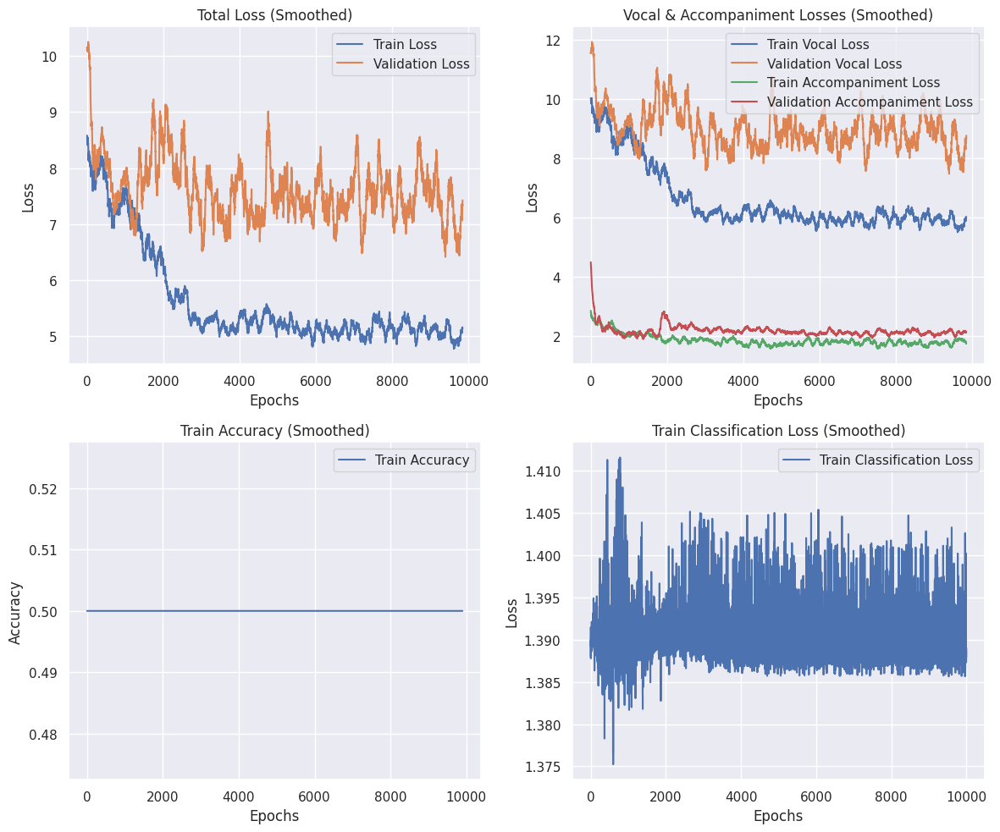

In [ ]:
train_losses, val_losses, train_vocal_losses, val_vocal_losses, train_accompaniment_losses, val_accompaniment_losses, train_sdrs, val_sdrs, train_accs, val_accs, train_cls_losses, val_cls_losses = evaluation_metrics
plot_avg_losses(train_losses, val_losses, train_vocal_losses, val_vocal_losses, train_accompaniment_losses, val_accompaniment_losses, train_accs, val_accs, train_cls_losses, val_cls_losses, window_size=100, truncate=50)

In [ ]:
plot_sdr(train_sdrs, val_sdrs, window_size=100)

###Source seperating random segments

These are 6 seconds segments, which the model was not explicitely trained on

In [ ]:
model = UNet().to(device)  # Reinitialize the model architecture
model.load_state_dict(torch.load("best_model.pth"))  # Load the saved weights
model.eval()  # Set the model to evaluation mode

In [ ]:
def source_seperation(model, criterion, train_dataloader, train_dataset, sample_rate, n_fft, hop_length, n_iter=200, use_accompaniment_mask=True, start_time_sec=None):
    if start_time_sec is None:
        mix_spectrogram, vocals_spectrogram, accompaniment_spectrogram = next(iter(train_dataloader))
    else:
        mix_spectrogram, vocals_spectrogram, accompaniment_spectrogram = train_dataset.get_spectrogram_by_time(0, start_time_sec)
        mix_spectrogram = mix_spectrogram.unsqueeze(0)
        vocals_spectrogram = vocals_spectrogram.unsqueeze(0)
        accompaniment_spectrogram = accompaniment_spectrogram.unsqueeze(0)

    mix_spectrogram = mix_spectrogram.to(device)
    vocals_spectrogram = vocals_spectrogram.to(device)
    accompaniment_spectrogram = accompaniment_spectrogram.to(device)

    # Masks Inference
    masks = model(mix_spectrogram.unsqueeze(1))

    vocal_mask, accompaniment_mask = masks[:, 0, :, :].unsqueeze(1), masks[:, 1, :, :].unsqueeze(1)

    vocal_mask = F.interpolate(vocal_mask, size=(mix_spectrogram.shape[-2], mix_spectrogram.shape[-1]), mode="bilinear", align_corners=False)
    accompaniment_mask = F.interpolate(accompaniment_mask, size=(mix_spectrogram.shape[-2], mix_spectrogram.shape[-1]), mode="bilinear", align_corners=False)

    # Masks Application
    masked_vocals = mix_spectrogram * vocal_mask.squeeze(0)
    if use_accompaniment_mask:
        masked_accompaniment = mix_spectrogram * accompaniment_mask.squeeze(0)
    else:
        masked_accompaniment = mix_spectrogram - masked_vocals.squeeze(1)

    # Reconstruct original segment
    original_mixed_segment = spectrogram_to_audio(mix_spectrogram.detach().cpu(), sample_rate, n_fft, hop_length, n_iter=n_iter).squeeze(0)

    # Source Separation - vocals, accompaniment
    pred_vocals = spectrogram_to_audio(masked_vocals.detach().cpu(), sample_rate, n_fft, hop_length, n_iter=n_iter).squeeze(0)
    pred_accompaniment = spectrogram_to_audio(masked_accompaniment.detach().cpu(), sample_rate, n_fft, hop_length, n_iter=n_iter).squeeze(0)

    vocals_loss = criterion(vocals_spectrogram, masked_vocals.detach())
    accompaniment_loss = criterion(accompaniment_spectrogram, masked_accompaniment.detach())

    return original_mixed_segment, pred_vocals, pred_accompaniment, vocals_loss, accompaniment_loss, vocal_mask, accompaniment_mask


In [ ]:
vocals_loss = torch.tensor(100)
while vocals_loss.item() + accompaniment_loss.item() > 7.2:
  original_mixed_segment, pred_vocals, pred_accompaniment, vocals_loss, accompaniment_loss, vocal_mask, accompaniment_mask = source_seperation(model, criterion, train_dataloader, train_dataset, sample_rate, n_fft, hop_length, n_iter=200, use_accompaniment_mask=True)
  print("Total loss:", vocals_loss.item() + accompaniment_loss.item())
  print("Vocals loss:", vocals_loss.item())
  print("Accompaniment loss:", accompaniment_loss.item())
  print()

In [ ]:
original_mixed_segment, pred_vocals, pred_accompaniment, vocals_loss, accompaniment_loss, vocal_mask, accompaniment_mask = source_seperation(model, criterion, train_dataloader, train_dataset, sample_rate, n_fft, hop_length, n_iter=200, use_accompaniment_mask=True)
print(vocals_loss.item(), accompaniment_loss.item())

## Reconstruction!
# Here's an example of the mixed 6 seconds segment, and the masked vocals and accompaniment

In [ ]:
ipd.Audio(original_mixed_segment, rate=sample_rate)

In [ ]:
ipd.Audio(pred_vocals, rate=sample_rate)

In [ ]:
ipd.Audio(pred_accompaniment, rate=sample_rate)

##Vocal and Accompaniment Masks visualization

<Axes: >

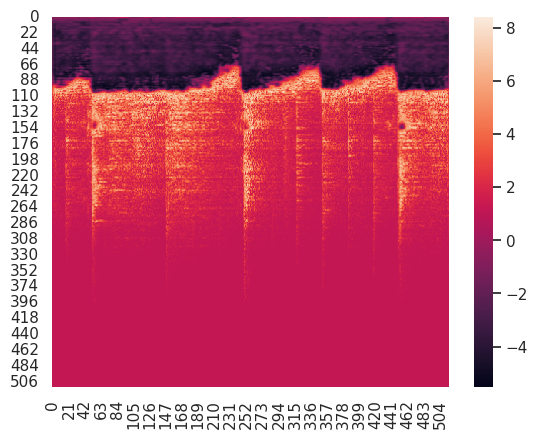

In [ ]:
vocal_mask = vocal_mask[0,0,:,:]
sns.heatmap(vocal_mask.detach().cpu())

<Axes: >

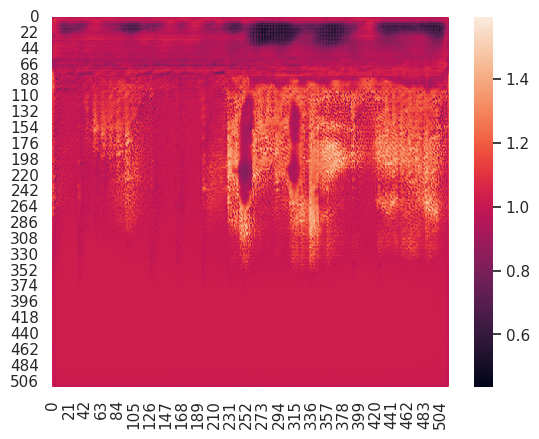

In [ ]:
sns.heatmap(accompaniment_mask[0,0,:,:].detach().cpu())

In [ ]:
sf.write("mixed.wav", original_mixed_segment, sample_rate)
sf.write("vocals.wav", pred_vocals, sample_rate)
sf.write("accompaniment.wav",  pred_accompaniment, sample_rate)

#**Overfitting a small dataset - 5 samples**

##**Data loading**

In [ ]:
samples_amount = 5
batch_size = 1

In [ ]:
train_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)
validation_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)
test_dataset = SpectrogramDataset(test_mix_spectrograms, test_vocal_spectrograms, test_accompaniment_spectrograms, n_fft, hop_length, duration, sample_rate)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)

##**Model Configuration & Training**

In [ ]:
epochs=10000

In [ ]:
model_5 = UNet().to(device)

In [ ]:
optimizer = Adam(model_5.parameters(), lr=1e-2)  #TODO: try smaller lrs
criterion = nn.L1Loss()
vocals_weight = 0.5
accompaniment_weight = 1-vocals_weight
#criterion = nn.MSELoss()

In [ ]:
evaluation_metrics = train(model_5, train_dataloader, validation_dataloader, criterion, optimizer, vocals_weight, accompaniment_weight, num_epochs=epochs, window_size=100)

Training...: 100%|██████████| 10000/10000 [2:19:38<00:00,  1.19epoch/s, train_loss=6.79, train_vocal_loss=5.38, train_accompaniment_loss=2.21, train_sdr=26.1, train_reconstruction_loss=29.2, val_loss=5.66, val_vocal_loss=8.67, val_accompaniment_loss=2.65, val_sdr=21.4, lr=0.0005]


##**Evaluation**

###Loss & SDR over Time

In [ ]:
train_losses, val_losses, train_vocal_losses, val_vocal_losses, train_accompaniment_losses, val_accompaniment_losses, train_sdrs, val_sdrs, train_accs, val_accs, train_cls_losses, val_cls_losses = evaluation_metrics

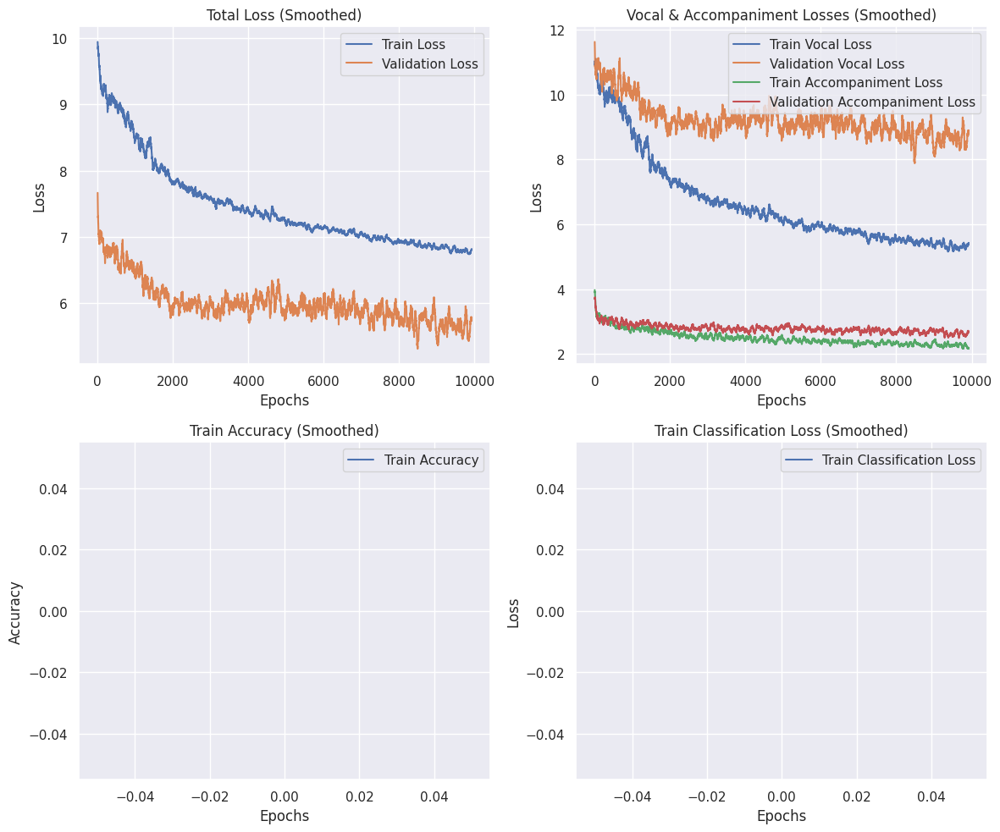

In [ ]:
plot_avg_losses(train_losses, val_losses, train_vocal_losses, val_vocal_losses, train_accompaniment_losses, val_accompaniment_losses, [], [], [], [], window_size=50, truncate=30)


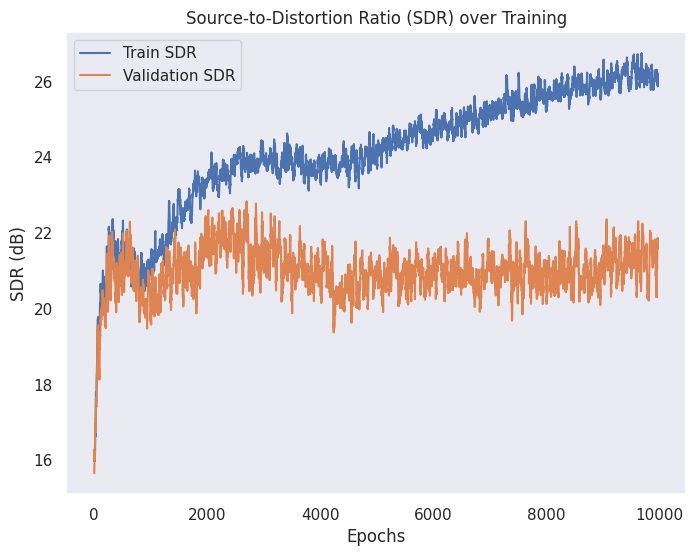

In [ ]:
plot_sdr(train_sdrs, val_sdrs)

###Source seperating random segments

These are 6 seconds segments, which the model was not explicitely trained on

In [ ]:
'''model_5 = UNet().to(device)  # Reinitialize the model architecture
model.load_state_dict(torch.load("best_model_5.pth"))  # Load the saved weights
model.eval()  # Set the model to evaluation mode'''

In [ ]:
def get_random_batch(train_dataloader):
  mix_spectrogram_batch, vocals_spectrogram_batch, accompaniment_spectrogram_batch = next(iter(train_dataloader))
  mix_spectrogram_batch = mix_spectrogram_batch.to(device)
  vocals_spectrogram_batch = vocals_spectrogram_batch.to(device)
  accompaniment_spectrogram_batch = accompaniment_spectrogram_batch.to(device)

  return mix_spectrogram_batch, vocals_spectrogram_batch, accompaniment_spectrogram_batch

In [ ]:
def get_masked_audios(model, mix_spectrogram_batch):
  # Predict Masks
  masks_batch = model(mix_spectrogram_batch.unsqueeze(1))
  vocal_masks_batch, accompaniment_masks_batch = masks_batch[:,0,:,:].unsqueeze(1), masks_batch[:,1,:,:].unsqueeze(1)

  # Apply Masks
  vocal_masks_batch = F.interpolate(vocal_masks_batch, size=(mix_spectrogram_batch.shape[-2], mix_spectrogram_batch.shape[-1]), mode="bilinear", align_corners=False)
  accompaniment_masks_batch = F.interpolate(accompaniment_masks_batch, size=(mix_spectrogram_batch.shape[-2], mix_spectrogram_batch.shape[-1]), mode="bilinear", align_corners=False)

  masked_vocals_batch = mix_spectrogram_batch * vocal_masks_batch
  masked_accompaniment_batch = mix_spectrogram_batch * accompaniment_masks_batch
  #masked_accompaniment_batch = mix_spectrogram_batch - masked_vocals_batch


  reconstructed_vocals_audios = spectrogram_to_audio(masked_vocals_batch.detach().cpu(), sample_rate, n_fft, hop_length)
  reconstructed_accompaniment_audios = spectrograms_to_audio(masked_accompaniment_batch.detach().cpu(), sample_rate, n_fft, hop_length)
  return reconstructed_vocals_audios, reconstructed_accompaniment_audios

## Reconstruction!

The reconstruction quality in a larger dataset is significantly worse

While the losses decrease, and sdrs increas, they did not match the metrics of a smaller dataset

In [ ]:
mix_spectrogram_batch, vocals_spectrogram_batch, accompaniment_spectrogram_batch = get_random_batch(train_dataloader)
reconstructed_vocals_audios, reconstructed_accompaniment_audios = get_masked_audios(model_5, mix_spectrogram_batch)

In [ ]:
song_idx = 0

In [ ]:
original_mixed = spectrogram_to_audio(mix_spectrogram_batch[song_idx].detach().cpu(), sample_rate, n_fft, hop_length)

reconstructed_vocals_audio = reconstructed_vocals_audios[song_idx]
reconstructed_accompaniment_audio= reconstructed_accompaniment_audios[song_idx]

In [ ]:
ipd.Audio(original_mixed, rate=sample_rate)

In [ ]:
ipd.Audio(reconstructed_vocals_audio, rate=sample_rate)

In [ ]:
ipd.Audio(reconstructed_accompaniment_audio, rate=sample_rate)

In [ ]:
reconstructed_accompaniment_audio

array([0.18908712, 0.3895064 , 0.41295484, ..., 0.285031  , 0.28241763,
       0.16864972], dtype=float32)

In [ ]:
sf.write("mixed.wav", original_mixed, sample_rate)
sf.write("vocals.wav", reconstructed_vocals_audio[0], sample_rate)
sf.write("accompaniment.wav",  reconstructed_accompaniment_audio, sample_rate)

# Hyperparameter Tuning

To find the best set of hyperparameters, i evaluated the impact of each one of them on a few epochs:
- Dataset size
- Network depth (encoder, decoder)
- Kernel size
- Learning rate
- Sigmoid
- Accompaniment / Vocals weights in L1 loss

## Parameter: Dataset Size
I explored evaluation metrics over 5 different dataset sizes, to estimate the capacity of my model to generalize over multiple songs

Dataset sizes $\in$ [1, 21, 41, 61, 81]

**Loss:** As visualized below, for any dataset which consists of more than 1 song, L1 loss converges at ~7. On the other hand, for a single song dataset, L1 loss goes below 7 after the first 30 epochs and continues to reduce over time

**SDR:** Similarly, the SDR of any dataset which consists of multiple songs converges at ~20, which is lower than the SDR value of a single song dataset after the first few epochs

In [ ]:
epochs=500

Training...:   0%|          | 2/500 [00:01<04:26,  1.87epoch/s, train_loss=24.3, train_vocal_loss=25.8, train_accompaniment_loss=22.7, average_val_loss=7.23e+6, val_loss=7.23e+6, val_vocal_loss=6.36e+6, val_accompaniment_loss=8.1e+6, train_sdr=14.3, val_sdr=11.9]

Epoch [1/500] -> Train Loss: 33.403557, Val Loss: 11444.384766, Train SDR: 2.00, Val SDR: 11.91, Current LR: 1.000000e-03


Training...:   0%|          | 1/500 [00:01<16:27,  1.98s/epoch, train_loss=30.4, train_vocal_loss=36.7, train_accompaniment_loss=24.1, average_val_loss=917, val_loss=917, val_vocal_loss=964, val_accompaniment_loss=871, train_sdr=4.34, val_sdr=11.4]

Epoch [1/500] -> Train Loss: 30.393391, Val Loss: 917.432995, Train SDR: 4.34, Val SDR: 11.39, Current LR: 1.000000e-03


Training...:   0%|          | 1/500 [00:02<24:23,  2.93s/epoch, train_loss=33.1, train_vocal_loss=40.2, train_accompaniment_loss=26.1, average_val_loss=196, val_loss=196, val_vocal_loss=263, val_accompaniment_loss=130, train_sdr=0.634, val_sdr=12.1]

Epoch [1/500] -> Train Loss: 33.120258, Val Loss: 196.364969, Train SDR: 0.63, Val SDR: 12.15, Current LR: 1.000000e-03


Training...:   0%|          | 1/500 [00:03<32:24,  3.90s/epoch, train_loss=36.5, train_vocal_loss=48.5, train_accompaniment_loss=24.4, average_val_loss=1.63e+3, val_loss=1.63e+3, val_vocal_loss=1.52e+3, val_accompaniment_loss=1.74e+3, train_sdr=2.62, val_sdr=10.9]

Epoch [1/500] -> Train Loss: 36.468132, Val Loss: 1627.227252, Train SDR: 2.62, Val SDR: 10.86, Current LR: 1.000000e-03


Training...:   0%|          | 1/500 [00:04<40:11,  4.83s/epoch, train_loss=27.1, train_vocal_loss=25.9, train_accompaniment_loss=28.3, average_val_loss=499, val_loss=499, val_vocal_loss=551, val_accompaniment_loss=447, train_sdr=2.15, val_sdr=10.9]

Epoch [1/500] -> Train Loss: 27.095694, Val Loss: 499.083931, Train SDR: 2.15, Val SDR: 10.86, Current LR: 1.000000e-03


Training...: 100%|██████████| 500/500 [33:38<00:00,  4.04s/epoch, train_loss=5.32, train_vocal_loss=8.21, train_accompaniment_loss=2.42, average_val_loss=6.86, val_loss=6.86, val_vocal_loss=10.7, val_accompaniment_loss=3.04, train_sdr=24.1, val_sdr=22.2]


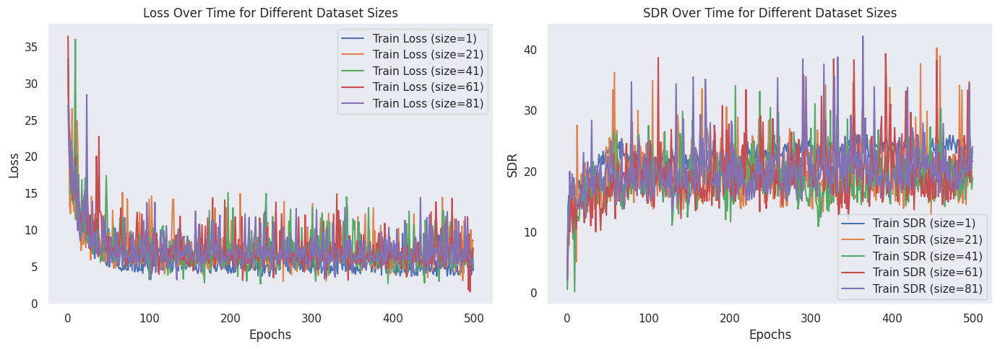

In [ ]:
dataset_sizes = list(range(1, 85, 20))  # Track dataset sizes

all_train_losses = []
all_val_losses = []
all_train_sdrs = []
all_val_sdrs = []

for dataset_size in dataset_sizes:
    samples_amount = dataset_size  # Adjust dataset size dynamically
    batch_size = 1

    train_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)
    validation_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)

    train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)

    model = UNet().to(device)
    optimizer = Adam(model.parameters(), lr=1e-3)
    criterion = nn.L1Loss()
    vocals_weight = 0.5
    accompaniment_weight = 1 - vocals_weight

    # Train model and get per-epoch losses & SDRs
    train_losses, val_losses, _, _, _, _, train_sdrs, val_sdrs = train(model, train_dataloader, validation_dataloader, criterion, optimizer, vocals_weight, accompaniment_weight, num_epochs=epochs)

    all_train_losses.append(train_losses)  # Store per-epoch loss
    all_val_losses.append(val_losses)
    all_train_sdrs.append(train_sdrs)
    all_val_sdrs.append(val_sdrs)

# ---- Plot the results ----
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Plot Loss Over Time
for i, dataset_size in enumerate(dataset_sizes):
    ax[0].plot(range(epochs), all_train_losses[i], label=f"Train Loss (size={dataset_size})", linestyle='-')

ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")
ax[0].set_title("Loss Over Time for Different Dataset Sizes")
ax[0].legend()
ax[0].grid()

# Plot SDR Over Time
for i, dataset_size in enumerate(dataset_sizes):
    ax[1].plot(range(epochs), all_train_sdrs[i], label=f"Train SDR (size={dataset_size})", linestyle='-')

ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("SDR")
ax[1].set_title("SDR Over Time for Different Dataset Sizes")
ax[1].legend()
ax[1].grid()

plt.tight_layout()
plt.show()


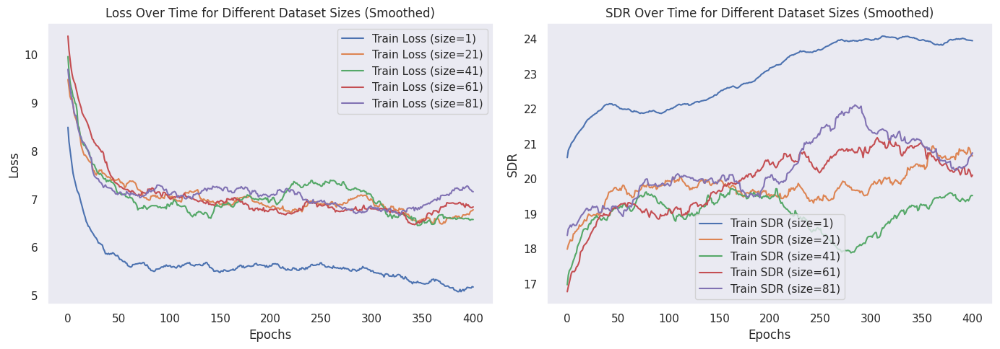

In [ ]:
def moving_average(data, window_size=10):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# ---- Plot the results ----

fig, ax = plt.subplots(1, 2, figsize=(14, 5))
window_size = 100  # Running average window size

# Plot Loss Over Time
for i, dataset_size in enumerate(dataset_sizes):
    smoothed_loss = moving_average(all_train_losses[i], window_size)
    ax[0].plot(range(len(smoothed_loss)), smoothed_loss, label=f"Train Loss (size={dataset_size})", linestyle='-')

ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")
ax[0].set_title("Loss Over Time for Different Dataset Sizes (Smoothed)")
# ax[0].set_yscale("log")
ax[0].legend()
ax[0].grid()

# Plot SDR Over Time
for i, dataset_size in enumerate(dataset_sizes):
    smoothed_sdr = moving_average(all_train_sdrs[i], window_size)
    ax[1].plot(range(len(smoothed_sdr)), smoothed_sdr, label=f"Train SDR (size={dataset_size})", linestyle='-')

ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("SDR")
ax[1].set_title("SDR Over Time for Different Dataset Sizes (Smoothed)")
# ax[1].set_yscale("log")
ax[1].legend()
ax[1].grid()

plt.tight_layout()
plt.show()


In [ ]:
# ---- Bar Plot for Mean Training Loss ----
plt.figure(figsize=(8, 5))
mean_train_losses = np.mean(all_train_losses, axis=1)  # Compute mean loss per dataset size
sns.barplot(x=dataset_sizes, y=mean_train_losses[-1], palette="Reds")

plt.xlabel("Dataset Size")
plt.ylabel("Mean Training Loss")
plt.title("Mean Training Loss vs. Dataset Size")
plt.grid(axis='y')

plt.show()

<ipython-input-78-5414d5b556b4>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=dataset_sizes, y=mean_train_losses, palette="Reds")


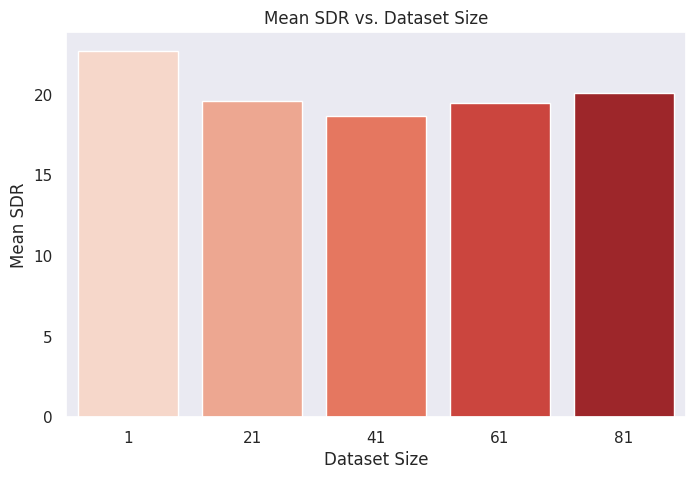

In [ ]:
# ---- Bar Plot for Mean Training Loss ----
plt.figure(figsize=(8, 5))
mean_train_losses = np.mean(all_train_sdrs, axis=1)  # Compute mean loss per dataset size
sns.barplot(x=dataset_sizes, y=mean_train_losses, palette="Reds")

plt.xlabel("Dataset Size")
plt.ylabel("Mean SDR")
plt.title("Mean SDR vs. Dataset Size")
plt.grid(axis='y')

plt.show()

## Parameter: Network Depth
I explored evaluation metrics over 5 different network depths, exploring the effect of deeper encoders and decoders on source seperation quality

Network Depths $\in$ [4, 6, 8, 10, 12]

**Results**

**Loss:** L1 is the lowest for an intermediate depth, of either 8 or 10 convolution layers for the encoders, and transpose convolution layers for the decoders. Too many or few layers results in higher L1 losses, as the model lacks capacity of generalizing, or is too large to learn.

**SDR:** Similarly, the SDR is the highest for 8 or 10 stacked layers, resulting in higher quality of source seperation

In [ ]:
samples_amount = 1
batch_size = 1

In [ ]:
train_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)
validation_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)
#test_dataset = SpectrogramDataset(test_mix_spectrograms, test_vocal_spectrograms, test_accompaniment_spectrograms, n_fft, hop_length, duration, sample_rate)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
mixed_audio, vocals_audio, accompaniment_audio = get_single_song()
mixed_spectrogram, vocal_spectrogram, accompaniment_spectrogram = get_single_song_spectrograms(mixed_audio, vocals_audio, accompaniment_audio, sample_rate, n_fft, hop_length, duration)
reconstructed_mix_audio, reconstructed_vocals_audio, reconstructed_accompaniment_audio = get_reconstructed_audios(mixed_spectrogram, vocal_spectrogram, accompaniment_spectrogram, sample_rate, n_fft, hop_length, duration)

In [ ]:
epochs=100

In [ ]:
encoder_channels_list = [[2 ** (5 + i) for i in range(1, j)] for j in range(2, 7)]
decoder_channels_list = encoder_channels_list
vocals_weight = 0.5
accompaniment_weight = 1-vocals_weight

[64]


Training...:   2%|▏         | 2/100 [00:00<00:20,  4.89epoch/s, train_loss=32, train_vocal_loss=33.6, train_accompaniment_loss=30.5, average_val_loss=32.1, val_loss=32.1, val_vocal_loss=33, val_accompaniment_loss=31.2, train_sdr=2.1, val_sdr=12.7]

Epoch [1/100] -> Train Loss: 38.832558, Val Loss: 32.164503, Train SDR: 2.79, Val SDR: 9.03, Current LR: 1.000000e-04


Training...: 100%|██████████| 100/100 [00:16<00:00,  6.14epoch/s, train_loss=10.4, train_vocal_loss=10.8, train_accompaniment_loss=10, average_val_loss=11.8, val_loss=11.8, val_vocal_loss=12.9, val_accompaniment_loss=10.6, train_sdr=18.6, val_sdr=18]


[64, 128]


Training...:   2%|▏         | 2/100 [00:00<00:13,  7.21epoch/s, train_loss=34.2, train_vocal_loss=42.3, train_accompaniment_loss=26.1, average_val_loss=35.2, val_loss=35.2, val_vocal_loss=38.6, val_accompaniment_loss=31.8, train_sdr=2.93, val_sdr=3.1]

Epoch [1/100] -> Train Loss: 38.426250, Val Loss: 34.192057, Train SDR: 8.21, Val SDR: 7.35, Current LR: 1.000000e-04


Training...: 100%|██████████| 100/100 [00:17<00:00,  5.65epoch/s, train_loss=14.2, train_vocal_loss=17.2, train_accompaniment_loss=11.1, average_val_loss=15, val_loss=15, val_vocal_loss=19.3, val_accompaniment_loss=10.8, train_sdr=12.1, val_sdr=13.6]


[64, 128, 256]


Training...:   2%|▏         | 2/100 [00:00<00:20,  4.83epoch/s, train_loss=23, train_vocal_loss=28.8, train_accompaniment_loss=17.1, average_val_loss=27.7, val_loss=27.7, val_vocal_loss=37.4, val_accompaniment_loss=17.9, train_sdr=7.05, val_sdr=15.2]

Epoch [1/100] -> Train Loss: 30.490078, Val Loss: 26.277425, Train SDR: -0.38, Val SDR: 14.74, Current LR: 1.000000e-04


Training...: 100%|██████████| 100/100 [00:18<00:00,  5.29epoch/s, train_loss=8.87, train_vocal_loss=15.3, train_accompaniment_loss=2.41, average_val_loss=12, val_loss=12, val_vocal_loss=18.5, val_accompaniment_loss=5.6, train_sdr=22.2, val_sdr=22.3]


[64, 128, 256, 512]


Training...:   2%|▏         | 2/100 [00:01<00:45,  2.16epoch/s, train_loss=20, train_vocal_loss=25.3, train_accompaniment_loss=14.7, average_val_loss=30.6, val_loss=30.6, val_vocal_loss=33, val_accompaniment_loss=28.2, train_sdr=10.8, val_sdr=14.8]

Epoch [1/100] -> Train Loss: 26.796074, Val Loss: 29.880923, Train SDR: 7.92, Val SDR: 16.86, Current LR: 1.000000e-04


Training...: 100%|██████████| 100/100 [00:38<00:00,  2.62epoch/s, train_loss=6.6, train_vocal_loss=8.66, train_accompaniment_loss=4.54, average_val_loss=8.08, val_loss=8.08, val_vocal_loss=8.65, val_accompaniment_loss=7.51, train_sdr=21.6, val_sdr=21.5]


[64, 128, 256, 512, 1024]


Training...:   1%|          | 1/100 [00:02<04:34,  2.77s/epoch, train_loss=33.8, train_vocal_loss=37, train_accompaniment_loss=30.5, average_val_loss=37.4, val_loss=37.4, val_vocal_loss=38.5, val_accompaniment_loss=36.3, train_sdr=6.06, val_sdr=15.8]

Epoch [1/100] -> Train Loss: 41.401482, Val Loss: 36.312702, Train SDR: 2.47, Val SDR: 14.74, Current LR: 1.000000e-04


Training...: 100%|██████████| 100/100 [01:22<00:00,  1.21epoch/s, train_loss=14.5, train_vocal_loss=19.6, train_accompaniment_loss=9.34, average_val_loss=12.8, val_loss=12.8, val_vocal_loss=17.3, val_accompaniment_loss=8.36, train_sdr=13.2, val_sdr=13.1]


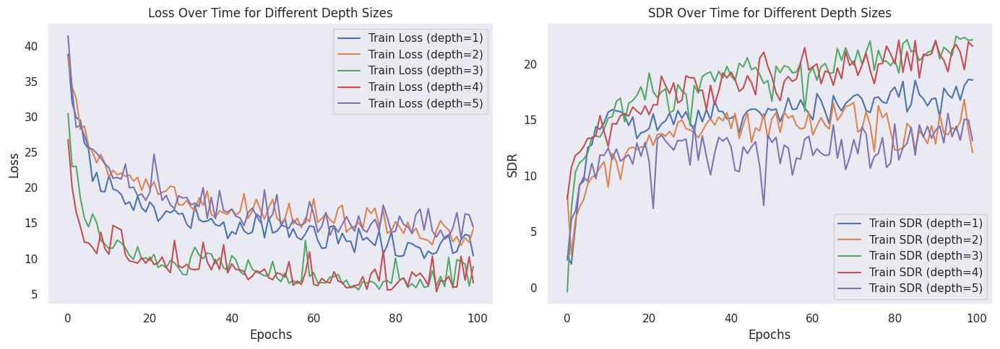

In [ ]:
all_train_losses = []
all_val_losses = []
all_train_sdrs = []
all_val_sdrs = []

for encoder_channels, decoder_channels in zip(encoder_channels_list, decoder_channels_list):
  print(encoder_channels)
  model = UNet(encoder_channels=encoder_channels, decoder_channels=decoder_channels[::-1]).to(device)
  optimizer = Adam(model.parameters(), lr=1e-4) #TODO: try smaller lrs
  criterion = nn.L1Loss()
  train_losses, val_losses, _, _, _, _, train_sdrs, val_sdrs = train(model, train_dataloader, validation_dataloader, criterion, optimizer, vocals_weight, accompaniment_weight, num_epochs=epochs)

  all_train_losses.append(train_losses)  # Store per-epoch loss
  all_val_losses.append(val_losses)
  all_train_sdrs.append(train_sdrs)
  all_val_sdrs.append(val_sdrs)

# ---- Plot the results ----
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Plot Loss Over Time
for depth in range(len(encoder_channels)):
    ax[0].plot(range(epochs), all_train_losses[depth], label=f"Train Loss (depth={depth+1})", linestyle='-')

ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")
ax[0].set_title("Loss Over Time for Different Depth Sizes")
ax[0].legend()
ax[0].grid()

# Plot SDR Over Time
for depth in range(len(encoder_channels)):
    ax[1].plot(range(epochs), all_train_sdrs[depth], label=f"Train SDR (depth={depth+1})", linestyle='-')

ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("SDR")
ax[1].set_title("SDR Over Time for Different Depth Sizes")
ax[1].legend()
ax[1].grid()

plt.tight_layout()
plt.show()

In [ ]:
train(model, train_dataloader, validation_dataloader, criterion, optimizer, vocals_weight, accompaniment_weight, num_epochs=epochs)

## Parameter: Convolution Kernel Size
I explored evaluation metrics over 5 different kernel sizes. Since spectrograms are strongly based on spatial information of ...

Kernel Size $\in$ [3, 5, 7, 9, 11]

**Results**

**Loss:** L1 is the lowest for an intermediate kernel size, of either 5 or 7. This is matim that smaller kernel sizes and deeper networks contain less parameters and achieve large receptive fields.

**SDR:** Similarly, the SDR is the highest for kernel size of 5 or 7, resulting in higher quality of source seperation

In [ ]:
samples_amount = 1
batch_size = 1

In [ ]:
train_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)
validation_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
mixed_audio, vocals_audio, accompaniment_audio = get_single_song()
mixed_spectrogram, vocal_spectrogram, accompaniment_spectrogram = get_single_song_spectrograms(mixed_audio, vocals_audio, accompaniment_audio, sample_rate, n_fft, hop_length, duration)
reconstructed_mix_audio, reconstructed_vocals_audio, reconstructed_accompaniment_audio = get_reconstructed_audios(mixed_spectrogram, vocal_spectrogram, accompaniment_spectrogram, sample_rate, n_fft, hop_length, duration)

In [ ]:
epochs=100

In [ ]:
kernel_sizes = [3 + 2 * i for i in range(5)]
vocals_weight = 0.5
accompaniment_weight = 1-vocals_weight

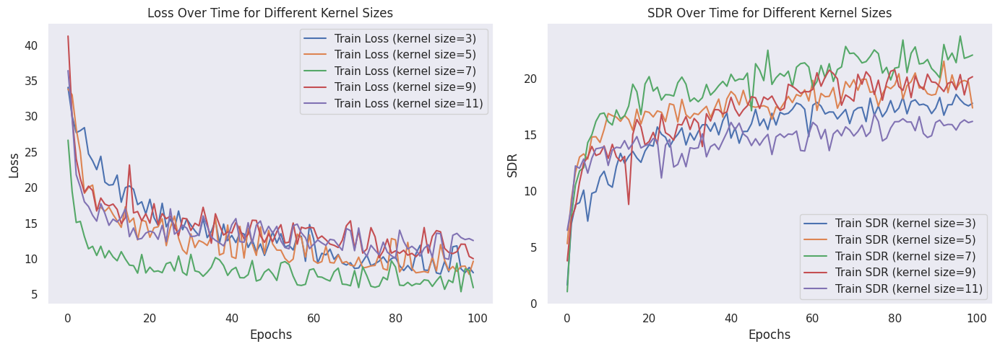

In [ ]:
all_train_losses = []
all_val_losses = []
all_train_sdrs = []
all_val_sdrs = []

for kernel_size in kernel_sizes:
  print("kernel size:", kernel_size)
  model = UNet(kernel_size=kernel_size).to(device)
  optimizer = Adam(model.parameters(), lr=1e-4) #TODO: try smaller lrs
  criterion = nn.L1Loss()
  train_losses, val_losses, _, _, _, _, train_sdrs, val_sdrs = train(model, train_dataloader, validation_dataloader, criterion, optimizer, vocals_weight, accompaniment_weight, num_epochs=epochs)

  all_train_losses.append(train_losses)  # Store per-epoch loss
  all_val_losses.append(val_losses)
  all_train_sdrs.append(train_sdrs)
  all_val_sdrs.append(val_sdrs)

# ---- Plot the results ----
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Plot Loss Over Time
for i, kernel_size in enumerate(kernel_sizes):
    ax[0].plot(range(epochs), all_train_losses[i], label=f"Train Loss (kernel size={kernel_size})", linestyle='-')

ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")
ax[0].set_title("Loss Over Time for Different Kernel Sizes")
ax[0].legend()
ax[0].grid()

# Plot SDR Over Time
for i, kernel_size in enumerate(kernel_sizes):
    ax[1].plot(range(epochs), all_train_sdrs[i], label=f"Train SDR (kernel size={kernel_size})", linestyle='-')

ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("SDR")
ax[1].set_title("SDR Over Time for Different Kernel Sizes")
ax[1].legend()
ax[1].grid()

plt.tight_layout()
plt.show()

## Parameter: Learning rate
I trained the network using a grid search over 4 different learning rate in log scale, to determine how to effectively train the source seperator network

Learning rate $ \in [10^{-2},10^{-3},10^{-4},10^{-5}] $

**Results**

**Loss:** L1 loss is reducing nicely using a learning rate of either $10^{-2}$ or $10^{-3}$. It's reducing as well for lower learning rates, but much slower.

**SDR:** Similarly, the SDR is improving over time at the higher learning rates ($10^{-2}$ or $10^{-3}$), and doesn't seem to converge after the first 100 epochs.

In [ ]:
samples_amount = 1
batch_size = 1

In [ ]:
train_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)
validation_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
mixed_audio, vocals_audio, accompaniment_audio = get_single_song()
mixed_spectrogram, vocal_spectrogram, accompaniment_spectrogram = get_single_song_spectrograms(mixed_audio, vocals_audio, accompaniment_audio, sample_rate, n_fft, hop_length, duration)
reconstructed_mix_audio, reconstructed_vocals_audio, reconstructed_accompaniment_audio = get_reconstructed_audios(mixed_spectrogram, vocal_spectrogram, accompaniment_spectrogram, sample_rate, n_fft, hop_length, duration)

In [ ]:
epochs=100

In [ ]:
learning_rates = [10 ** (-i) for i in range(2, 6)]
vocals_weight = 0.5
accompaniment_weight = 1-vocals_weight
print(learning_rates)

[0.01, 0.001, 0.0001, 1e-05]


learning rate: 0.01


Training...:   2%|▏         | 2/100 [00:01<00:47,  2.08epoch/s, train_loss=29.5, train_vocal_loss=36.3, train_accompaniment_loss=22.7, average_val_loss=1.13e+17, val_loss=1.13e+17, val_vocal_loss=1.91e+17, val_accompaniment_loss=3.56e+16, train_sdr=11.6, val_sdr=10.9]

Epoch [1/100] -> Train Loss: 37.828526, Val Loss: 544278824615936.000000, Train SDR: 2.77, Val SDR: 11.94, Current LR: 1.000000e-02


Training...: 100%|██████████| 100/100 [00:47<00:00,  2.11epoch/s, train_loss=5.71, train_vocal_loss=7.73, train_accompaniment_loss=3.7, average_val_loss=5.27, val_loss=5.27, val_vocal_loss=7.49, val_accompaniment_loss=3.06, train_sdr=22.6, val_sdr=21.3]


learning rate: 0.001


Training...:   2%|▏         | 2/100 [00:01<00:46,  2.11epoch/s, train_loss=16.8, train_vocal_loss=19.9, train_accompaniment_loss=13.7, average_val_loss=35.3, val_loss=35.3, val_vocal_loss=34, val_accompaniment_loss=36.6, train_sdr=11.2, val_sdr=11.1]

Epoch [1/100] -> Train Loss: 27.106243, Val Loss: 32.021255, Train SDR: 1.71, Val SDR: 7.43, Current LR: 1.000000e-03


Training...: 100%|██████████| 100/100 [00:27<00:00,  3.70epoch/s, train_loss=4.05, train_vocal_loss=6.2, train_accompaniment_loss=1.9, average_val_loss=4.97, val_loss=4.97, val_vocal_loss=8.45, val_accompaniment_loss=1.48, train_sdr=22.6, val_sdr=22.7]


learning rate: 0.0001


Training...:   1%|          | 1/100 [00:00<01:33,  1.06epoch/s, train_loss=38.8, train_vocal_loss=51, train_accompaniment_loss=26.6, average_val_loss=30.7, val_loss=30.7, val_vocal_loss=31.5, val_accompaniment_loss=29.9, train_sdr=3.38, val_sdr=14.3]

Epoch [1/100] -> Train Loss: 38.796227, Val Loss: 30.712601, Train SDR: 3.38, Val SDR: 14.34, Current LR: 1.000000e-04


Training...: 100%|██████████| 100/100 [00:35<00:00,  2.82epoch/s, train_loss=10.8, train_vocal_loss=16.8, train_accompaniment_loss=4.73, average_val_loss=8.77, val_loss=8.77, val_vocal_loss=11.1, val_accompaniment_loss=6.45, train_sdr=18.2, val_sdr=19.2]


learning rate: 1e-05


Training...:   2%|▏         | 2/100 [00:01<00:45,  2.16epoch/s, train_loss=37.4, train_vocal_loss=44.9, train_accompaniment_loss=29.8, average_val_loss=37.4, val_loss=37.4, val_vocal_loss=40.8, val_accompaniment_loss=34, train_sdr=2.19, val_sdr=14.7]

Epoch [1/100] -> Train Loss: 38.877377, Val Loss: 37.034082, Train SDR: 0.39, Val SDR: 14.00, Current LR: 1.000000e-05


Training...: 100%|██████████| 100/100 [00:44<00:00,  2.26epoch/s, train_loss=15.6, train_vocal_loss=18.4, train_accompaniment_loss=12.9, average_val_loss=13.5, val_loss=13.5, val_vocal_loss=13.4, val_accompaniment_loss=13.6, train_sdr=15.7, val_sdr=14.5]


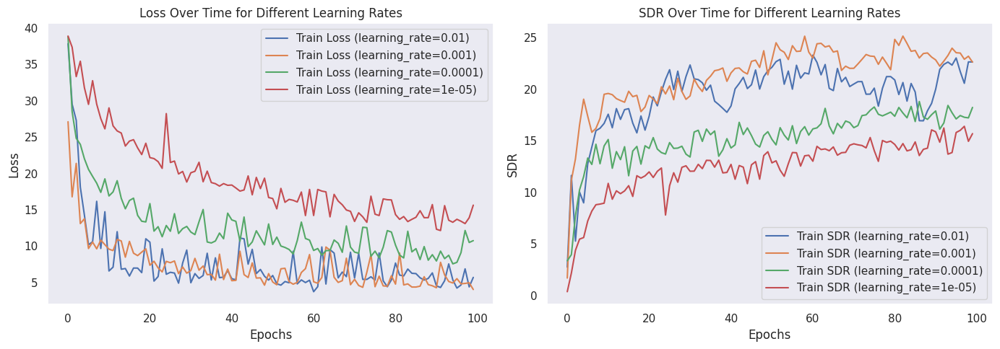

In [ ]:
all_train_losses = []
all_val_losses = []
all_train_sdrs = []
all_val_sdrs = []

for learning_rate in learning_rates:
  print("learning rate:", learning_rate)
  model = UNet().to(device)
  optimizer = Adam(model.parameters(), lr=learning_rate) #TODO: try smaller lrs
  criterion = nn.L1Loss()
  train_losses, val_losses, _, _, _, _, train_sdrs, val_sdrs = train(model, train_dataloader, validation_dataloader, criterion, optimizer, vocals_weight, accompaniment_weight, num_epochs=epochs)

  all_train_losses.append(train_losses)  # Store per-epoch loss
  all_val_losses.append(val_losses)
  all_train_sdrs.append(train_sdrs)
  all_val_sdrs.append(val_sdrs)

# ---- Plot the results ----
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Plot Loss Over Time
for i, learning_rate in enumerate(learning_rates):
    ax[0].plot(range(epochs), all_train_losses[i], label=f"Train Loss (learning_rate={learning_rate})", linestyle='-')

ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")
ax[0].set_title("Loss Over Time for Different Learning Rates")
ax[0].legend()
ax[0].grid()

# Plot SDR Over Time
for i, learning_rate in enumerate(learning_rates):
    ax[1].plot(range(epochs), all_train_sdrs[i], label=f"Train SDR (learning_rate={learning_rate})", linestyle='-')

ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("SDR")
ax[1].set_title("SDR Over Time for Different Learning Rates")
ax[1].legend()
ax[1].grid()

plt.tight_layout()
plt.show()

## Parameter: Sigmoid gate
I wanted to figure out the importance of a sigmoid gate at the end of the network.

Sigmoid gate $\in$ [True, False]

**Results**

**Loss:** L1 loss is similar for both configurations, but is much more unstable with a sigmoid gate.

**SDR:** Interestingly, the SDR seems to converge after 200 epochs without a sigmoid gate, but continues to increase without converging using a sigmoid gate.

In [ ]:
samples_amount = 1
batch_size = 1

In [ ]:
train_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)
validation_dataset = SpectrogramDataset(train_mix_spectrograms[:samples_amount], train_vocal_spectrograms[:samples_amount], train_accompaniment_spectrograms[:samples_amount], n_fft, hop_length, duration, sample_rate)
#test_dataset = SpectrogramDataset(test_mix_spectrograms, test_vocal_spectrograms, test_accompaniment_spectrograms, n_fft, hop_length, duration, sample_rate)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
epochs=500

Training...:   0%|          | 2/500 [00:01<04:13,  1.96epoch/s, train_loss=14.6, train_vocal_loss=16.8, train_accompaniment_loss=12.4, average_val_loss=33.1, val_loss=33.1, val_vocal_loss=39.4, val_accompaniment_loss=26.8, train_sdr=18.8, val_sdr=-2.83]

Epoch [1/500] -> Train Loss: 17.378492, Val Loss: 25.734552, Train SDR: 17.25, Val SDR: 21.01, Current LR: 1.000000e-03


Training...:   0%|          | 2/500 [00:01<04:00,  2.07epoch/s, train_loss=24.6, train_vocal_loss=24.1, train_accompaniment_loss=25.1, average_val_loss=2.38e+3, val_loss=2.38e+3, val_vocal_loss=2.42e+3, val_accompaniment_loss=2.33e+3, train_sdr=10.9, val_sdr=11.4]

Epoch [1/500] -> Train Loss: 37.038471, Val Loss: 42.252617, Train SDR: 4.27, Val SDR: 11.66, Current LR: 1.000000e-03


Training...: 100%|██████████| 500/500 [01:36<00:00,  5.18epoch/s, train_loss=5.37, train_vocal_loss=8.18, train_accompaniment_loss=2.57, average_val_loss=5.35, val_loss=5.35, val_vocal_loss=7.68, val_accompaniment_loss=3.02, train_sdr=23.7, val_sdr=22.5]


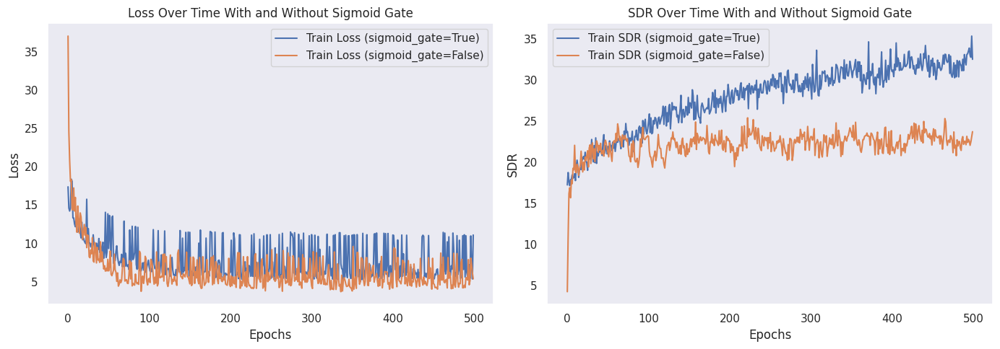

In [ ]:
all_train_losses = []
all_val_losses = []
all_train_sdrs = []
all_val_sdrs = []
sigmoid_gates = [True, False]
for sigmoid_gate in sigmoid_gates:

  model = UNet(sigmoid=sigmoid_gate).to(device)
  optimizer = Adam(model.parameters(), lr=1e-3) #TODO: try smaller lrs
  criterion = nn.L1Loss()
  train_losses, val_losses, _, _, _, _, train_sdrs, val_sdrs = train(model, train_dataloader, validation_dataloader, criterion, optimizer, vocals_weight, accompaniment_weight, num_epochs=epochs)

  all_train_losses.append(train_losses)  # Store per-epoch loss
  all_val_losses.append(val_losses)
  all_train_sdrs.append(train_sdrs)
  all_val_sdrs.append(val_sdrs)

# ---- Plot the results ----
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Plot Loss Over Time
for i, sigmoid_gate in enumerate(sigmoid_gates):
    ax[0].plot(range(epochs), all_train_losses[i], label=f"Train Loss (sigmoid_gate={sigmoid_gate})", linestyle='-')

ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")
ax[0].set_title("Loss Over Time With and Without Sigmoid Gate")
ax[0].legend()
ax[0].grid()

# Plot SDR Over Time
for i, sigmoid_gate in enumerate(sigmoid_gates):
    ax[1].plot(range(epochs), all_train_sdrs[i], label=f"Train SDR (sigmoid_gate={sigmoid_gate})", linestyle='-')

ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("SDR")
ax[1].set_title("SDR Over Time With and Without Sigmoid Gate")
ax[1].legend()
ax[1].grid()

plt.tight_layout()
plt.show()

## Parameter: Vocal / Accompaniment weights

I explored different weights for the vocal and accompaniment source seperation.

Vocal weight $\in$ [0.1, 0.2, ..., 0.9]

**Results**

**Loss:** L1 is the lowest for smaller vocal weights (0.1, 0.2). This is because generally, L1 is significantly lower of accompaniment source seperation compared to vocals.

**SDR:** Conversely, the SDR is the highest for higher vocal weights (0.8, 0.9). Experimenting with different weight sets, i figured out that seperating vocals is a much more difficult task, therefore it needs to be weighted higher accordingly.

In [ ]:
epochs=500

In [ ]:
vocal_weights = [0.1* i for i in range(1, 10)]

vocals_weight= 0.1


Training...:   0%|          | 2/500 [00:01<04:07,  2.02epoch/s, train_loss=12.7, train_vocal_loss=20.9, train_accompaniment_loss=11.8, average_val_loss=29.4, val_loss=29.4, val_vocal_loss=44, val_accompaniment_loss=27.8, train_sdr=19.2, val_sdr=4.91]

Epoch [1/500] -> Train Loss: 15.504571, Val Loss: 13.901088, Train SDR: 16.19, Val SDR: 20.58, Current LR: 1.000000e-03


Training...: 100%|██████████| 500/500 [01:35<00:00,  5.24epoch/s, train_loss=2.58, train_vocal_loss=10.6, train_accompaniment_loss=1.68, average_val_loss=2.74, val_loss=2.74, val_vocal_loss=8.51, val_accompaniment_loss=2.1, train_sdr=28.8, val_sdr=29.6]


vocals_weight= 0.2


Training...:   0%|          | 2/500 [00:01<04:08,  2.00epoch/s, train_loss=15.1, train_vocal_loss=26.7, train_accompaniment_loss=12.2, average_val_loss=31.9, val_loss=31.9, val_vocal_loss=47, val_accompaniment_loss=28.1, train_sdr=18.9, val_sdr=-9.57]

Epoch [1/500] -> Train Loss: 18.685595, Val Loss: 24.934757, Train SDR: 15.47, Val SDR: 15.12, Current LR: 1.000000e-03


Training...: 100%|██████████| 500/500 [01:40<00:00,  4.97epoch/s, train_loss=3.41, train_vocal_loss=10.8, train_accompaniment_loss=1.55, average_val_loss=4.22, val_loss=4.22, val_vocal_loss=8.83, val_accompaniment_loss=3.07, train_sdr=28.3, val_sdr=28.3]


vocals_weight= 0.30000000000000004


Training...:   0%|          | 2/500 [00:01<04:01,  2.06epoch/s, train_loss=14.2, train_vocal_loss=20, train_accompaniment_loss=11.7, average_val_loss=31.2, val_loss=31.2, val_vocal_loss=35, val_accompaniment_loss=29.6, train_sdr=18, val_sdr=-13.5]

Epoch [1/500] -> Train Loss: 17.150936, Val Loss: 25.243218, Train SDR: 15.93, Val SDR: 19.37, Current LR: 1.000000e-03


Training...: 100%|██████████| 500/500 [01:31<00:00,  5.49epoch/s, train_loss=6.85, train_vocal_loss=21.7, train_accompaniment_loss=0.475, average_val_loss=4.7, val_loss=4.7, val_vocal_loss=8.8, val_accompaniment_loss=2.94, train_sdr=29.2, val_sdr=29.5]


vocals_weight= 0.4


Training...:   0%|          | 1/500 [00:00<08:01,  1.04epoch/s, train_loss=19.5, train_vocal_loss=25, train_accompaniment_loss=15.9, average_val_loss=32.7, val_loss=32.7, val_vocal_loss=39.9, val_accompaniment_loss=27.8, train_sdr=16.6, val_sdr=3.2]

Epoch [1/500] -> Train Loss: 19.549213, Val Loss: 32.662051, Train SDR: 16.64, Val SDR: 3.20, Current LR: 1.000000e-03


Training...: 100%|██████████| 500/500 [01:51<00:00,  4.47epoch/s, train_loss=4.66, train_vocal_loss=8.48, train_accompaniment_loss=2.11, average_val_loss=6.38, val_loss=6.38, val_vocal_loss=11.4, val_accompaniment_loss=3.04, train_sdr=31.6, val_sdr=30.8]


vocals_weight= 0.5


Training...:   0%|          | 2/500 [00:01<04:01,  2.06epoch/s, train_loss=20.2, train_vocal_loss=29.1, train_accompaniment_loss=11.3, average_val_loss=31.3, val_loss=31.3, val_vocal_loss=33.2, val_accompaniment_loss=29.4, train_sdr=20.7, val_sdr=-4.78]

Epoch [1/500] -> Train Loss: 17.929234, Val Loss: 25.223933, Train SDR: 16.18, Val SDR: 13.95, Current LR: 1.000000e-03


Training...: 100%|██████████| 500/500 [01:48<00:00,  4.60epoch/s, train_loss=8.17, train_vocal_loss=13.9, train_accompaniment_loss=2.4, average_val_loss=5.4, val_loss=5.4, val_vocal_loss=8.89, val_accompaniment_loss=1.92, train_sdr=31.3, val_sdr=30.7]


vocals_weight= 0.6000000000000001


Training...:   0%|          | 1/500 [00:01<09:14,  1.11s/epoch, train_loss=27, train_vocal_loss=36, train_accompaniment_loss=13.5, average_val_loss=27.8, val_loss=27.8, val_vocal_loss=40.3, val_accompaniment_loss=8.96, train_sdr=15.9, val_sdr=17.1]

Epoch [1/500] -> Train Loss: 26.992157, Val Loss: 27.757489, Train SDR: 15.89, Val SDR: 17.14, Current LR: 1.000000e-03


Training...: 100%|██████████| 500/500 [01:45<00:00,  4.72epoch/s, train_loss=13.1, train_vocal_loss=21.5, train_accompaniment_loss=0.483, average_val_loss=6.69, val_loss=6.69, val_vocal_loss=9.21, val_accompaniment_loss=2.92, train_sdr=29.7, val_sdr=29.7]


vocals_weight= 0.7000000000000001


Training...:   0%|          | 2/500 [00:01<04:01,  2.06epoch/s, train_loss=24.1, train_vocal_loss=29.3, train_accompaniment_loss=12, average_val_loss=27.7, val_loss=27.7, val_vocal_loss=35.7, val_accompaniment_loss=9.06, train_sdr=17.8, val_sdr=-3.08]

Epoch [1/500] -> Train Loss: 20.059704, Val Loss: 23.028288, Train SDR: 16.04, Val SDR: 19.06, Current LR: 1.000000e-03


Training...: 100%|██████████| 500/500 [01:37<00:00,  5.13epoch/s, train_loss=13.8, train_vocal_loss=19.5, train_accompaniment_loss=0.53, average_val_loss=7.07, val_loss=7.07, val_vocal_loss=8.87, val_accompaniment_loss=2.85, train_sdr=29.6, val_sdr=32.1]


vocals_weight= 0.8


Training...:   0%|          | 2/500 [00:01<04:01,  2.06epoch/s, train_loss=19.9, train_vocal_loss=20.5, train_accompaniment_loss=17.2, average_val_loss=32.8, val_loss=32.8, val_vocal_loss=37.2, val_accompaniment_loss=15.4, train_sdr=17.8, val_sdr=-307]

Epoch [1/500] -> Train Loss: 21.370710, Val Loss: 20.071916, Train SDR: 15.89, Val SDR: 21.47, Current LR: 1.000000e-03


Training...: 100%|██████████| 500/500 [01:36<00:00,  5.17epoch/s, train_loss=16.4, train_vocal_loss=20.4, train_accompaniment_loss=0.531, average_val_loss=9.1, val_loss=9.1, val_vocal_loss=11, val_accompaniment_loss=1.5, train_sdr=31, val_sdr=31]


vocals_weight= 0.9


Training...:   0%|          | 2/500 [00:01<04:00,  2.07epoch/s, train_loss=17.1, train_vocal_loss=17.3, train_accompaniment_loss=16, average_val_loss=45.2, val_loss=45.2, val_vocal_loss=47.1, val_accompaniment_loss=27.4, train_sdr=18.7, val_sdr=-1.32]

Epoch [1/500] -> Train Loss: 31.601439, Val Loss: 19.499510, Train SDR: 17.41, Val SDR: 17.68, Current LR: 1.000000e-03


Training...: 100%|██████████| 500/500 [01:23<00:00,  5.96epoch/s, train_loss=8.59, train_vocal_loss=9.23, train_accompaniment_loss=2.85, average_val_loss=8.33, val_loss=8.33, val_vocal_loss=8.95, val_accompaniment_loss=2.75, train_sdr=31.6, val_sdr=31.9]


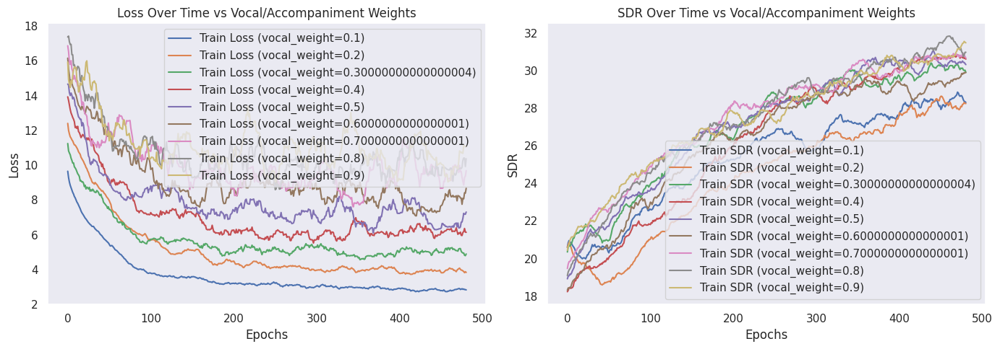

In [ ]:
all_train_losses = []
all_val_losses = []
all_train_sdrs = []
all_val_sdrs = []

for vocals_weight in vocal_weights:
  accompaniment_weight = 1 - vocals_weight
  print("vocals_weight=",vocals_weight)
  model = UNet(sigmoid=True).to(device)
  optimizer = Adam(model.parameters(), lr=1e-3) #TODO: try smaller lrs
  criterion = nn.L1Loss()
  train_losses, val_losses, _, _, _, _, train_sdrs, val_sdrs = train(model, train_dataloader, validation_dataloader, criterion, optimizer, vocals_weight, accompaniment_weight, num_epochs=epochs)

  all_train_losses.append(train_losses)  # Store per-epoch loss
  all_val_losses.append(val_losses)
  all_train_sdrs.append(train_sdrs)
  all_val_sdrs.append(val_sdrs)

# ---- Plot the results ----
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Plot Loss Over Time
for i, vocal_weight in enumerate(vocal_weights):
    smoothed_train_losses = moving_average(all_train_losses[i], window_size=20)
    ax[0].plot(range(len(smoothed_train_losses)), smoothed_train_losses, label=f"Train Loss (vocal_weight={vocal_weight})", linestyle='-')

ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")
ax[0].set_title("Loss Over Time vs Vocal/Accompaniment Weights")
ax[0].legend()
ax[0].grid()

# Plot SDR Over Time
for i, vocal_weight in enumerate(vocal_weights):
    smoothed_train_sdrs = moving_average(all_train_sdrs[i], window_size=20)
    ax[1].plot(range(len(smoothed_train_sdrs)), smoothed_train_sdrs, label=f"Train SDR (vocal_weight={vocal_weight})", linestyle='-')

ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("SDR")
ax[1].set_title("SDR Over Time vs Vocal/Accompaniment Weights")
ax[1].legend()
ax[1].grid()

plt.tight_layout()
plt.show()